# General process and imports

In [1]:
import os
import time
import glob
from functools import partial


import numpy as np
import pandas as pd
import torch
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, Subset
import nevergrad as ng

from PIL import Image
from skimage.transform import resize
from IPython.display import clear_output
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

from drawing import draw_imgs, maps_img
from turing import generate_pattern

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"

if torch.cuda.is_available():
    device = torch.device('cuda')
    load_to_cpu = False
else:
    device = torch.device('cpu')
    load_to_cpu = True

In [3]:
raid_prefix = 'raid/msindeeva'
npy_prefix = f'{raid_prefix}/npy_patterns'

In [4]:
mobilenet = models.mobilenet_v2(pretrained=True).to(device)
mobilenet.eval()
print('Success!')

Success!


In [5]:
vgg = models.vgg19(pretrained=True).to(device)
vgg.eval()
print('VGG success!')

VGG success!


In [6]:
inception = models.inception_v3(pretrained=True).to(device)
inception.eval()
print('Inception success!')

Inception success!


In [7]:
models = [mobilenet, vgg, inception]

In [7]:
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

In [8]:
def get_custom_transform(img, pil=True, tensor=True):
    all_transforms = []
    
    if pil:
        crop_size = min(img.size)
        pil_transform = transforms.Compose([
            transforms.CenterCrop(crop_size),
            transforms.Resize(224),
        ])
        all_transforms.append(pil_transform)
    if tensor:
        tensor_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])
        all_transforms.append(tensor_transform)

    full_transform = transforms.Compose(all_transforms)
    return full_transform

In [9]:
imagenet_path = '/workspace/raid/datasets/imagenet/val'

class AdversarialImageNet(Dataset):
    def __init__(
            self, imagenet_path, adv=None, tensor_transform=False, 
            adv_addition='original', adv_transform=None):
        self.imagenet_path = imagenet_path
        self.imagenet_data = torchvision.datasets.ImageFolder(self.imagenet_path)
        
        self.adv = adv
        if adv_addition not in ('original', 'resized'):
            raise ValueError('`adv_addition` must be either "original" or "resized"')
        self.adv_addition = adv_addition
        self.adv_transform = adv_transform
        if tensor_transform:
            self.tensor_transform = get_custom_transform(None, pil=False, tensor=True)
        else:
            self.tensor_transform = None
    
    def __len__(self):
        return len(self.imagenet_data)
    
    def __getitem__(self, idx):
        img, gt_class = self.imagenet_data[idx]
        pil_transform = get_custom_transform(img, pil=True, tensor=False)
        
        if self.adv is not None:
            if self.adv_addition == 'original':
                attack_img = add_attack(img, self.adv, self.adv_transform, final_transform=pil_transform)
            else:
                attack_img = add_attack(pil_transform(img), self.adv, self.adv_transform)
        else:
            attack_img = pil_transform(img)
        
        if self.tensor_transform is not None:
            return self.tensor_transform(attack_img), gt_class
        else:
            return attack_img, gt_class
            

In [10]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

img_size = tuple(adv_dataset[0][0].shape[-2:])

In [11]:
import requests

# ImageNet class labels
LABELS_URL = 'https://s3.amazonaws.com/outcome-blog/imagenet/labels.json'
class_names = list(requests.get(LABELS_URL).json().values())
n_classes = len(class_names)

In [12]:
def forward(img, net, transform=None, batch=False, cpu_out=False):
    # perform transformation and store resizing info
    if not batch:
        if transform is not None:
            trans_img = transform(img).unsqueeze(0)
        else:
            trans_img = img.unsqueeze(0)
    else:
        trans_img = img
    
    # perform forward-pass
    trans_img = trans_img.to(device)
    if cpu_out:
        out_logits = net(trans_img).to('cpu')
    else:
        out_logits = net(trans_img)
        
    del trans_img
    torch.cuda.empty_cache()
    
    # decode the outputs
    return torch.softmax(out_logits, 1)

def print_class(out_scores):
    class_idx = torch.argmax(out_scores).item()
    print(f'Class: "{class_names[class_idx]}"')
    print(f'Score: {out_scores[0, class_idx].item():.3f}')

In [13]:
def attack_transform(adv, img):
    return resize(adv, img.size[::-1])

def add_attack(img, adv, attack_transform=None, final_transform=None):
    if attack_transform is not None:
        full_attack = attack_transform(adv, img)
    else:
        full_attack = adv
    attack_img = Image.fromarray(np.clip(img + full_attack.astype(np.int), 0, 255).astype(np.uint8), 'RGB')
    
    if final_transform is not None:
        return final_transform(attack_img)
    else:
        return attack_img
    
def find_attacks(optimizers, loss_fun):
    opt_loss_hists = {}
    opt_recommendations = {}
    for name, optim in optimizers.items():
        opt_loss_hist = []    

        for i in range(optim.budget):
            x = optim.ask()
            loss_val = loss_fun(*x.args, **x.kwargs)
            optim.tell(x, loss_val)
            
            #tmp_rec = optim.provide_recommendation()
            #opt_loss_hist.append(loss_fun(*tmp_rec.args, **tmp_rec.kwargs))
            opt_loss_hist.append(optim.current_bests['pessimistic'].mean)
            
            if i % 10 == 1:
                clear_output()
                plt.title(f'Loss history for {name}')
                plt.plot(opt_loss_hist)
                plt.show()
            del x
            del loss_val

        recommendation = optim.provide_recommendation()
        opt_recommendations[name] = recommendation
        opt_loss_hists[name] = opt_loss_hist
        print(f'Optimal loss for {name}: {opt_loss_hist[-1]}')
    return opt_loss_hists, opt_recommendations

In [14]:
turing_names224 = os.listdir("turing_224_true/")

In [15]:
def tile(a, times, channel_axis=2):
    axes = set(range(a.ndim))
    axes.remove(channel_axis)
    return np.repeat(np.repeat(a, times, axis=axes.pop()), times, axis=axes.pop())

In [16]:
def pattern_sr_loss(pattern, adv_dataset, model=mobilenet, n_imgs=100):
    # use pattern as adversarial attack
    adv_dataset.adv = pattern
    indices = np.random.choice(range(len(adv_dataset)), n_imgs, replace=False)
    attacks = Subset(adv_dataset, indices)
    loader = DataLoader(attacks, batch_size=128, num_workers=8)

    # perform attacks
    gts = []
    attack_classes = []
    for batch, gt in tqdm(loader, desc='Attack in progress'):
        out = forward(batch, model, batch=True)
        gts.extend(gt.numpy().tolist())
        attack_classes.extend(out.argmax(axis=-1).cpu().detach().numpy().tolist())
        del out
        
    del loader
    del attacks

    # calculate success rate
    gts = np.array(gts)
    attack_classes = np.array(attack_classes)
    sr = (gts != attack_classes).sum() / len(gts)
    return 1 - sr

In [17]:
def get_init_maps(init_maps, init_multiplier, channel_axis=0, tile_init=True):
    if tile_init:
        return tile(np.sign(init_maps), init_multiplier, channel_axis=channel_axis)
    else:
        full_shape = np.array(init_maps.shape) * init_multiplier
        full_shape[channel_axis] /= init_multiplier
        return np.sign(resize(init_maps, full_shape))

# Single picture `nevergrad` attack

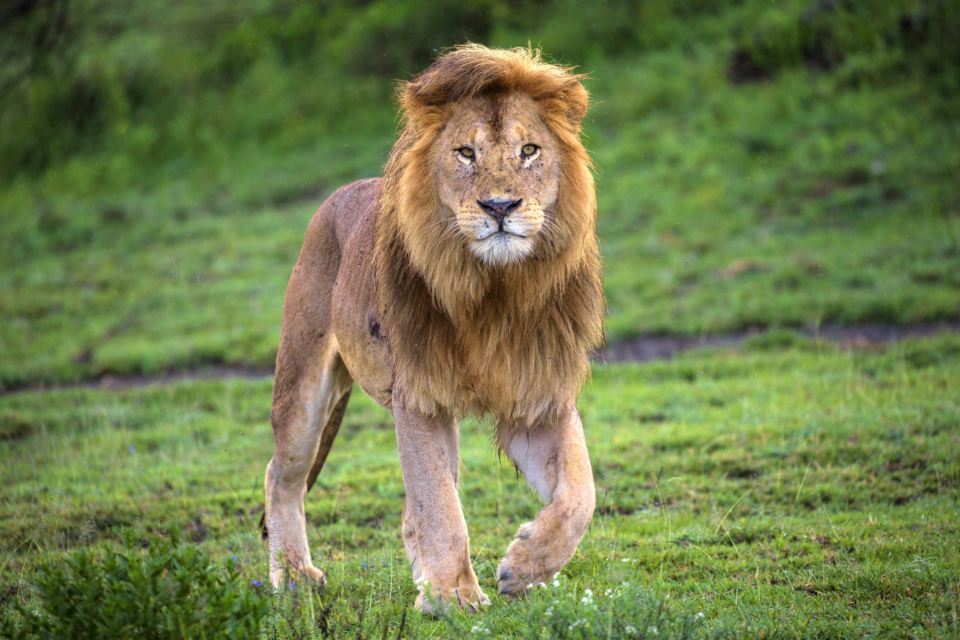

In [5]:
image_path = "lion-conservators-center.jpg"
img1 = transforms.Resize(640)(Image.open(image_path))
img1

In [6]:
pil_transform = transforms.Compose([
    transforms.CenterCrop(300),
    transforms.Resize(224),
])

tensor_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

full_transform = transforms.Compose([
    pil_transform,
    tensor_transform,    
])

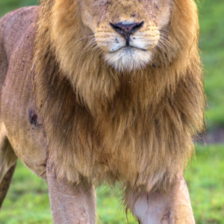

In [8]:
img2 = pil_transform(img1)
img2

In [8]:
img = img1
pre_transform = full_transform

In [9]:
img.size

(960, 640)

In [13]:
true_scores = forward(img, mobilenet, transform=pre_transform)
gt_class = torch.argmax(true_scores).item()
print_class(true_scores)

Class: "lion, king of beasts, Panthera leo"
Score: 0.828


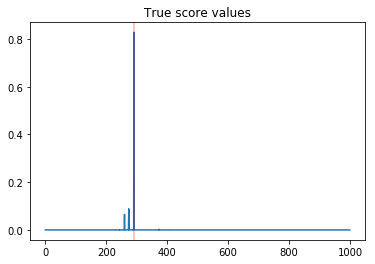

In [14]:
plt.title('True score values')
plt.plot(true_scores[0].cpu().detach().numpy())
plt.axvline(gt_class, c='red', alpha=0.3)
plt.show()

In [8]:
def loss(adv, img, model_scores, attack_transform=None, loss_hist=None, draw=True):
    attack = add_attack(img, adv, attack_transform)
    scores = model_scores(attack)
    loss_val = np.log(scores[0, gt_class].item())
        
    if loss_hist is not None:
        loss_hist.append(loss_val)
        
        if draw:
            clear_output()
            plt.plot(loss_hist)
            plt.show()
            
    return loss_val

In [ ]:
adv_shape = (i // 40 for i in img.size[::-1])
adv_shape = (*adv_shape, 3)

arg = ng.var.Array(*adv_shape).bounded(-10, 10)
instrum = ng.Instrumentation(arg)

In [ ]:
from functools import partial

model_scores = partial(forward, net=mobilenet, transform=pre_transform)

In [ ]:
optimizers = {
    #'1+1':  ng.optimizers.OnePlusOne(instrumentation=instrum, budget=230),
    #'1+1 recombining': ng.optimizers.RecombiningOptimisticNoisyDiscreteOnePlusOne(instrumentation=instrum, budget=100), 
    'CMA': ng.optimizers.CMA(instrumentation=instrum, budget=500),
    #'2P-DE': ng.optimizers.TwoPointsDE(instrumentation=instrum, budget=1000),
    #'1P-DE': ng.optimizers.OnePointDE(instrumentation=instrum, budget=300),
}
loss_fun = partial(loss, img=img, model_scores=model_scores, attack_transform=attack_transform)

In [55]:
optimizers['CMA'].budget = 6000

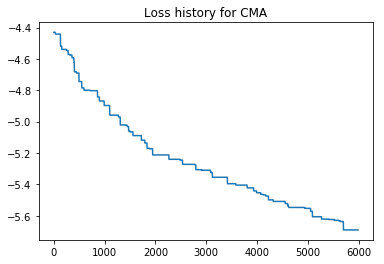

Optimal loss for CMA: -5.690613700451835


In [56]:
opt_loss_hists, opt_recommendations = find_attacks(optimizers, model_scores, loss_fun)

 ^ after 10 000 iterations

In [57]:
attack_scores = forward(add_attack(img, opt_recommendations['CMA'].args[0], attack_transform=attack_transform), mobilenet, transform=pre_transform)
print_class(attack_scores)

Class: "dhole, Cuon alpinus"
Score: 0.913


In [58]:
attack_scores[0, gt_class].item()

0.0033775195479393005

In [51]:
np.sort(true_scores[0].cpu().detach().numpy())[::-1][5:].max()

0.0011871345

In [59]:
np.sort(attack_scores[0].cpu().detach().numpy())[::-1][5:].max()

0.0009550119

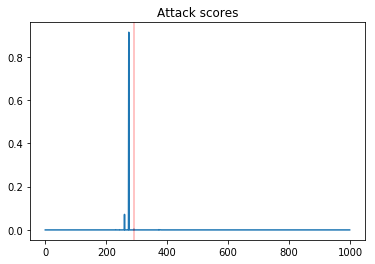

In [60]:
plt.title('Attack scores')
plt.plot(attack_scores[0].cpu().detach().numpy())
plt.axvline(gt_class, c='red', alpha=0.3)
plt.show()

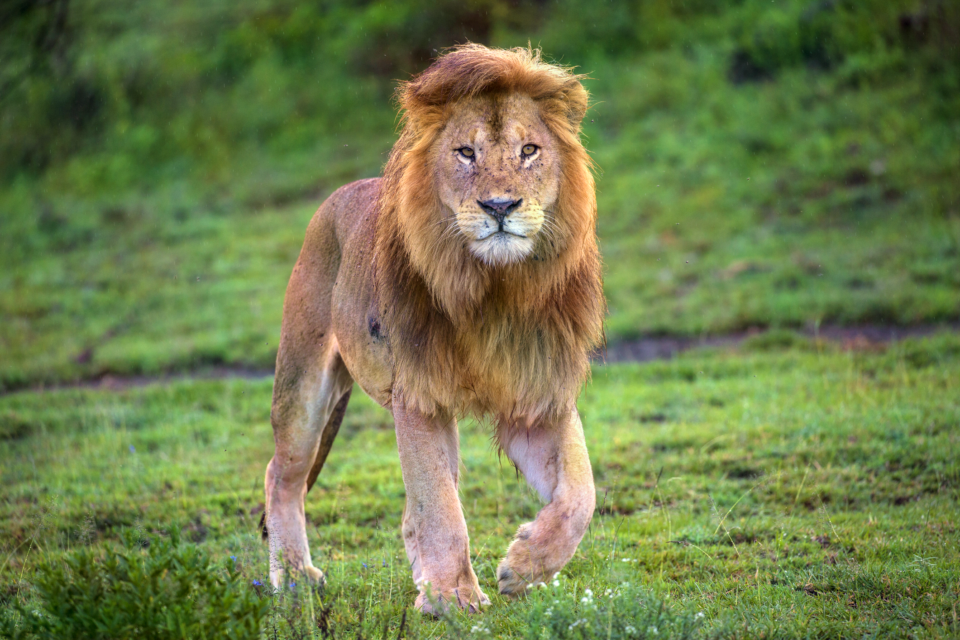

In [61]:
add_attack(img, opt_recommendations['CMA'].args[0], attack_transform=attack_transform)

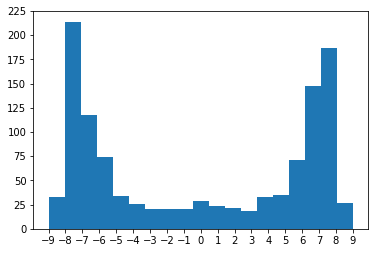

In [62]:
int_attack = opt_recommendations['CMA'].args[0].astype(np.int)
plt.hist(int_attack.flatten(), bins=len(np.unique(int_attack)))
plt.xticks(np.unique(int_attack))
plt.show()

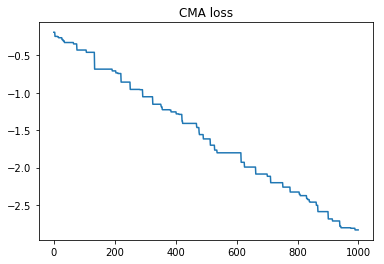

In [91]:
for name in optimizers.keys():
    plt.title(f'{name} loss')
    plt.plot(opt_loss_hists[name])
    plt.show()

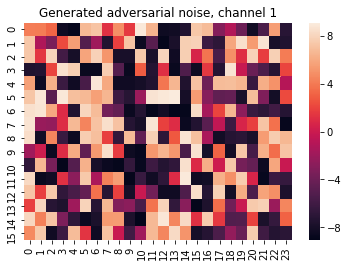

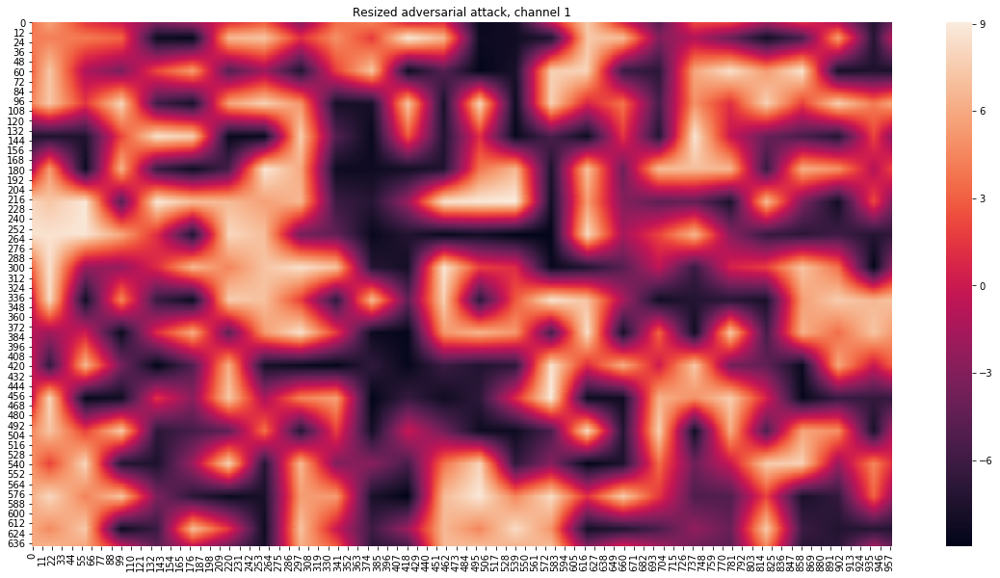

In [110]:

channel = 1
plt.title(f'Generated adversarial noise, channel {channel}')
sns.heatmap(opt_recommendations['CMA'].args[0][..., channel])
plt.show()

plt.figure(figsize=(20, 10))
plt.title(f'Resized adversarial attack, channel {channel}')
sns.heatmap(attack_transform(opt_recommendations['CMA'].args[0], img)[..., channel])
plt.show()

# Universal attacks

In [118]:
def uni_sr_tile_loss(adv, adv_dataset, model=mobilenet, n_imgs=100, adv_multiplier=3):
    # tile the adversarial pattern
    full_adv = tile(adv, adv_multiplier)
    return pattern_sr_loss(full_adv, adv_dataset, model=model, n_imgs=n_imgs)

def uni_sr_resize_loss(adv, adv_dataset, model=mobilenet, n_imgs=100, adv_multiplier=3):
    # tile the adversarial pattern
    resized_shape = tuple(i * adv_multiplier for i in adv.shape[:-1])
    full_adv = resize(adv, resized_shape)
    return pattern_sr_loss(full_adv, adv_dataset, model=model, n_imgs=n_imgs)

In [113]:
adv_shape = (7, 7, 3)
adv_multiplier = 32

adv_arg = ng.var.Array(*adv_shape).bounded(-10, 10)
instrum = ng.Instrumentation(adv_arg)

In [114]:
instrum.dimension

147

In [115]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

In [119]:
uni_sr_loss_fun = partial(uni_sr_resize_loss, adv_dataset=adv_dataset, n_imgs=512, adv_multiplier=adv_multiplier)

optimizers = {
    #'1+1':  ng.optimizers.OnePlusOne(instrumentation=instrum, budget=230),
    #'RS': ng.optimizers.RandomSearch(instrumentation=instrum, budget=230),
    #'1+1 recombining': ng.optimizers.RecombiningOptimisticNoisyDiscreteOnePlusOne(instrumentation=instrum, budget=100), 
    'CMA': ng.optimizers.CMA(instrumentation=instrum, budget=250),
    #'2P-DE': ng.optimizers.TwoPointsDE(instrumentation=instrum, budget=1000),
    #'1P-DE': ng.optimizers.OnePointDE(instrumentation=instrum, budget=300),
}

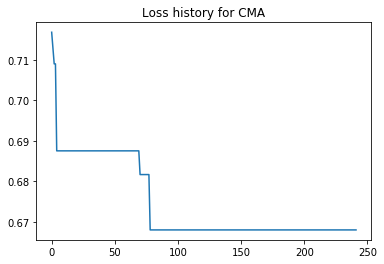


Optimal loss for CMA: 0.66796875
CPU times: user 22min 43s, sys: 5min 40s, total: 28min 23s
Wall time: 22min 35s


In [123]:
%%time
opt_loss_hists, opt_recommendations = find_attacks(optimizers, loss_fun=uni_sr_loss_fun)

In [76]:
adv_pattern = opt_recommendations['CMA'].args[0]

def get_labels(dataset, model=mobilenet, batch_size=10):
    loader = DataLoader(dataset, batch_size=batch_size)
    
    # perform attacks
    gts = []
    attack_classes = []
    for batch, gt in tqdm(loader, desc='Attack in progress'):
        out = forward(batch, model, batch=True)
        gts.extend(gt.numpy().tolist())
        attack_classes.extend(out.argmax(axis=-1).numpy().tolist())
        del out
        
    del loader
    return gts, attack_classes

cool_pics_idx = np.array([13982, 11505, 20812, 13922, 16343, 30463, 22515, 48743, 32243, 32032])
cool_pics = Subset(adv_dataset, cool_pics_idx)
cool_pics.adv = adv_pattern
gt_classes, attack_classes = get_labels(cool_pics, batch_size=len(cool_pics))

In [124]:
resized_shape = tuple(i * adv_multiplier for i in adv_pattern.shape[:-1])
full_adv = resize(adv_pattern, resized_shape)

In [125]:
1 - pattern_sr_loss(full_adv, adv_dataset, mobilenet, n_imgs=10000)

0.2885

In [126]:
1 - pattern_sr_loss(tile(adv_pattern, adv_multiplier), adv_dataset, mobilenet, n_imgs=10000)

0.3053

In [112]:
np.save('uni_tile_30.npy', tile(adv_pattern, adv_multiplier))

In [20]:
n_attack_samples = 10
n_draw_samples = 10

#attack_indices = np.random.choice(range(len(imagenet_data)), n_attack_samples, replace=False)
#draw_indices = np.random.choice(attack_indices, n_draw_samples, replace=False)
cool_pics = np.array([13982, 11505, 20812, 13922, 16343, 30463, 22515, 48743, 32243, 32032])
imgs = [imagenet_data[i][0] for i in cool_pics]

#imgs = Subset(imagenet_data, cool_pics)
#draw_imgs = Subset(imagenet_data, draw_indices)

#img_loader = DataLoader(imgs, batch_size=n_attack_samples, num_workers=4, )

In [21]:
attack_indices = np.random.choice(range(len(imagenet_data)), 100, replace=False)
imgs100 = [imagenet_data[i][0] for i in attack_indices]
gt_outs100 = [forward(img, mobilenet, transform=pre_transform) for img in imgs100]
gt_classes100 = [out.argmax().item() for out in gt_outs100]
gt_labels = [f'{class_names[gt_classes100[i]]}: {out[0][gt_classes100[i]]:.3f}' for i, out in enumerate(gt_outs100)]

In [ ]:
torch.cuda.empty_cache()

In [330]:
imgs_batch = []
for img in imgs:
    new_img = pre_transform(img[0])
    imgs_batch.append(new_img)

In [26]:
gt_outs = [forward(img, mobilenet, transform=pre_transform) for img in imgs]
gt_classes = [out.argmax().item() for out in gt_outs]
gt_labels = [f'{class_names[gt_classes[i]]}: {out[0][gt_classes[i]]:.3f}' for i, out in enumerate(gt_outs)]

In [27]:
def success_rate(gt_classes, outs):
    n = 0
    for gt_class, out in zip(gt_classes, outs):
        if out.argmax().item() != gt_class:
            n += 1
    return n / len(gt_classes)

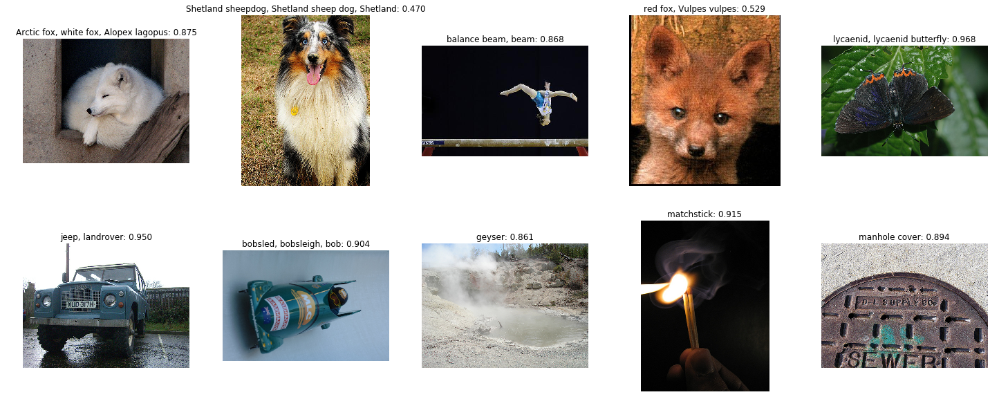

In [350]:
draw_imgs(imgs, labels=gt_labels)

In [226]:
adv_size = max(i // 40 for i in imgs[0].size[::-1])
adv_shape = (adv_size, adv_size, 3)

arg = ng.var.Array(*adv_shape).bounded(-10, 10)
instrum = ng.Instrumentation(arg)

adv_shape

(12, 12, 3)

In [227]:
def uni_conf_loss(
        adv, imgs, model_scores, attack_transform=attack_transform, 
        loss_hist=None, draw=True):
    n_successes = 0
    sum_conf = 0
    for i, img in enumerate(imgs):
        attack = add_attack(img, adv, attack_transform)
        scores = model_scores(attack)
        sum_conf += np.log(scores[0, gt_classes[i]].item()) 

    loss_val = sum_conf / len(imgs)
        
    if loss_hist is not None:
        loss_hist.append(loss_val)
        
        if draw:
            clear_output()
            plt.plot(loss_hist)
            plt.show()
            
    return loss_val

uni_conf_loss_fun = partial(uni_conf_loss, imgs=imgs, model_scores=model_scores, attack_transform=attack_transform)

optimizers = {
    #'1+1':  ng.optimizers.OnePlusOne(instrumentation=instrum, budget=230),
    #'RS': ng.optimizers.RandomSearch(instrumentation=instrum, budget=230),
    #'1+1 recombining': ng.optimizers.RecombiningOptimisticNoisyDiscreteOnePlusOne(instrumentation=instrum, budget=100), 
    'CMA': ng.optimizers.CMA(instrumentation=instrum, budget=1000),
    #'2P-DE': ng.optimizers.TwoPointsDE(instrumentation=instrum, budget=1000),
    #'1P-DE': ng.optimizers.OnePointDE(instrumentation=instrum, budget=300),
}

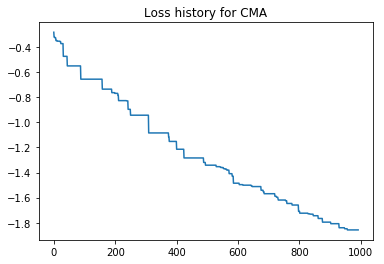

Optimal loss for CMA: -1.856973555107324


In [228]:
opt_loss_hists, opt_recommendations = find_attacks(optimizers, loss_fun=uni_conf_loss_fun)

Attack success rate: 0.5


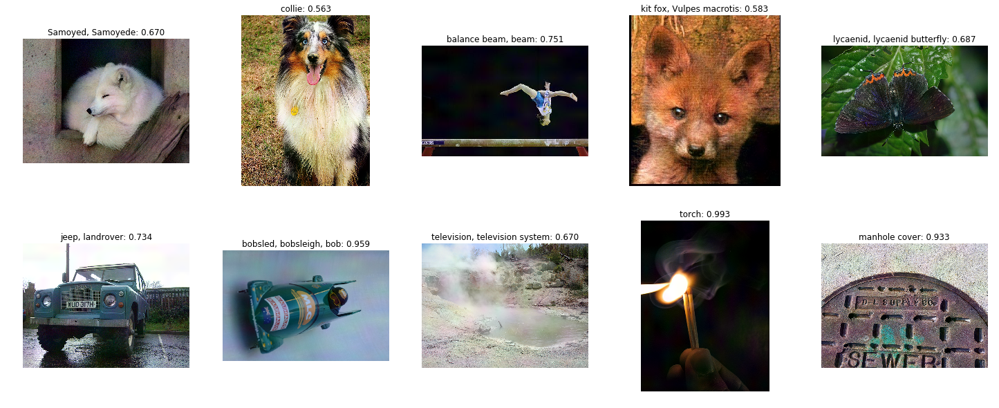

In [296]:
adv = opt_recommendations['CMA'].args[0]
attacks = [add_attack(img, adv, attack_transform) for img in imgs]
attack_outs = [forward(img, mobilenet, transform=pre_transform) for img in attacks]
attack_labels = [f'{class_names[torch.argmax(out).item()]}: {out.max().item():.3f}' for out in attack_outs]
print(f"Attack success rate: {success_rate(gt_classes, attack_outs)}")
draw_imgs(attacks, labels=attack_labels)

In [504]:
np.save('gen_uni_conf.npy', opt_recommendations['CMA'].args[0])

In [254]:
np.linalg.norm(adv.astype(np.int) / 255)

0.5109338910115837

In [28]:
from drawing import draw_attack_stats

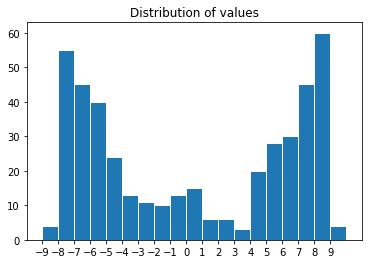

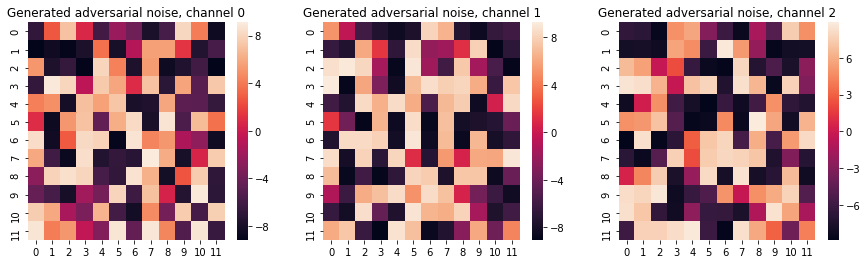

In [288]:
draw_attack_stats(adv)

In [269]:
from collections import Counter

In [367]:
Counter(opt_recommendations['CMA'].args[0].astype(np.int).flatten())


Counter({-6: 40,
         5: 28,
         2: 6,
         0: 15,
         7: 45,
         -5: 24,
         -8: 55,
         -7: 45,
         4: 20,
         -2: 10,
         -4: 13,
         8: 60,
         6: 30,
         -1: 13,
         -9: 4,
         1: 6,
         3: 3,
         9: 4,
         -3: 11})

# Turing patterns as attacks

## Independent patterns

In [12]:
def center_crop(adv, img):
    dim0, dim1 = img.size[::-1]
    adv_dim0, adv_dim1 = adv.shape[:2]
    idx0 = (adv_dim0 - dim0) // 2
    idx1 = (adv_dim1 - dim1) // 2
    return adv[idx0:idx0 + dim0, idx1:idx1 + dim1, :]

In [ ]:
# Add 800x800 attack to original image, old transform

for turing_name in turing_names:
    adv = np.load(f"turing_800/{turing_name}")
    attacks = [add_attack(img, adv, attack_transform=center_crop) for img in imgs]
    attack_outs = [forward(img, mobilenet, transform=pre_transform) for img in attacks]
    attack_classes = [out.argmax().item() for out in attack_outs]
    attack_labels = [f'{class_names[attack_classes[i]]}: {out[0][attack_classes[i]]:.3f}' for i, out in enumerate(attack_outs)]
    
    L1, L2 = turing_name.split('.')[0].split('_')[-2:]
    print(f"Turing {L1}, {L2}, Attack success rate: {success_rate(gt_classes, attack_outs)}")
    draw_imgs(attacks, labels=attack_labels)

In [ ]:
# Add 800x800 attack to original image, custom transform

pil_transforms = [get_custom_transform(img, tensor=False) for img in imgs]

success_rates = []
for turing_name in turing_names:
    adv = np.load(f"turing_800/{turing_name}")
    attacks = [add_attack(img, adv, attack_transform=center_crop, final_transform=t) for img, t in zip(imgs, pil_transforms)]
    attack_outs = [forward(img, mobilenet, transform=tensor_transform) for img in attacks]
    attack_classes = [out.argmax().item() for out in attack_outs]
    attack_labels = [f'{class_names[attack_classes[i]]}: {out[0][attack_classes[i]]:.3f}' for i, out in enumerate(attack_outs)]
    
    L1, L2 = turing_name.split('.')[0].split('_')[-2:]
    sr = success_rate(gt_classes, attack_outs)
    success_rates.append(sr)
    print(f"Turing {L1}, {L2}, Attack success rate: {sr}")
    draw_imgs(attacks, labels=attack_labels)

In [438]:
max(success_rates)

0.4

In [ ]:
# Add 224x224 attack to resized image, custom transform

pil_transforms = [get_custom_transform(img, tensor=False) for img in imgs]

success_rates = []
for turing_name in turing_names224:
    adv = np.load(f"turing_224/{turing_name}")
    attacks = [add_attack(t(img), adv, attack_transform=None) for img, t in zip(imgs, pil_transforms)]
    attack_outs = [forward(img, mobilenet, transform=tensor_transform) for img in attacks]
    attack_classes = [out.argmax().item() for out in attack_outs]
    attack_labels = [f'{class_names[attack_classes[i]]}: {out[0][attack_classes[i]]:.3f}' for i, out in enumerate(attack_outs)]
    
    L1, L2 = turing_name.split('.')[0].split('_')[-2:]
    sr = success_rate(gt_classes, attack_outs)
    success_rates.append(sr)
    print(f"Turing {L1}, {L2}, Attack success rate: {sr}")
    draw_imgs(attacks, labels=attack_labels)
print(f'Max success rate: {max(success_rates)}')

In [467]:
max(success_rates)

0.6

In [38]:
def pretty_size(size):
	"""Pretty prints a torch.Size object"""
	assert(isinstance(size, torch.Size))
	return " × ".join(map(str, size))

def dump_tensors(gpu_only=True):
	"""Prints a list of the Tensors being tracked by the garbage collector."""
	import gc
	total_size = 0
	for obj in gc.get_objects():
		try:
			if torch.is_tensor(obj):
				if not gpu_only or obj.is_cuda:
					print("%s:%s%s %s" % (type(obj).__name__, 
										  " GPU" if obj.is_cuda else "",
										  " pinned" if obj.is_pinned else "",
										  pretty_size(obj.size())))
					total_size += obj.numel()
			elif hasattr(obj, "data") and torch.is_tensor(obj.data):
				if not gpu_only or obj.is_cuda:
					print("%s → %s:%s%s%s%s %s" % (type(obj).__name__, 
												   type(obj.data).__name__, 
												   " GPU" if obj.is_cuda else "",
												   " pinned" if obj.data.is_pinned else "",
												   " grad" if obj.requires_grad else "", 
												   " volatile" if obj.volatile else "",
												   pretty_size(obj.data.size())))
					total_size += obj.data.numel()
		except Exception as e:
			pass        
	print("Total size:", total_size)

In [ ]:
# Add 224x224 attack to resized image, custom transform

pil_transforms = [get_custom_transform(img, tensor=False) for img in imgs100]

success_rates = []
for turing_name in turing_names224:
    adv = np.load(f"turing_224/{turing_name}")
    attacks = [add_attack(t(img), adv, attack_transform=None) for img, t in zip(imgs100, pil_transforms)]
    attack_outs = [forward(img, mobilenet, transform=tensor_transform) for img in attacks]
    attack_classes = [out.argmax().item() for out in attack_outs]
    attack_labels = [f'{class_names[attack_classes[i]]}: {out[0][attack_classes[i]]:.3f}' for i, out in enumerate(attack_outs)]
    
    L1, L2 = turing_name.split('.')[0].split('_')[-2:]
    sr = success_rate(gt_classes100, attack_outs)
    success_rates.append(sr)
    print(f"Turing {L1}, {L2}, Attack success rate: {sr}")
    #draw_imgs(attacks, labels=attack_labels)
print(f'Max success rate: {max(success_rates)}')

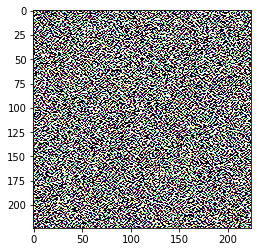

In [462]:
plt.imshow((adv + 10) / 20)

In [27]:
# Add 224x224 attack to resized image, custom transform
params = [tuple(map(int, turing_name.split('.')[0].split('_')[-2:])) for turing_name in turing_names224]
adv_imagenet = AdversarialImageNet(imagenet_path, adv=None, tensor_transform=True, 
                                   adv_addition='resized')

n_iterations = 10
n_imgs = 100
iter_results = []
for i in tqdm(range(n_iterations)):
    success_rates = []
    indices = np.random.choice(range(len(adv_imagenet)), n_imgs, replace=False)
    for p, turing_name in zip(params, turing_names224):
        L1, L2 = p

        adv = np.load(f"turing_224/{turing_name}")
        adv_imagenet.adv = adv
        attacks = Subset(adv_imagenet, indices)
        loader = DataLoader(attacks, batch_size=10, num_workers=4)

        gts = []
        attack_classes = []
        for batch, gt in loader:
            out = forward(batch, mobilenet, batch=True)
            gts.extend(gt.numpy().tolist())
            attack_classes.extend(out.argmax(axis=-1).numpy().tolist())

        gts = np.array(gts)
        attack_classes = np.array(attack_classes)
        sr = ((gts - attack_classes) != 0).sum() / len(gts)
        success_rates.append(sr)
        #print(f"Turing {L1}, {L2}, Attack success rate: {sr}")
    print(f'Max success rate: {max(success_rates)}')
    iter_results.append(success_rates)
    
res_stats = np.array(iter_results)
print(res_stats.mean(axis=0))

 10%|█         | 1/10 [01:25<12:45, 85.09s/it]

Max success rate: 0.65


 20%|██        | 2/10 [02:34<10:43, 80.42s/it]

Max success rate: 0.68


 30%|███       | 3/10 [03:54<09:22, 80.38s/it]

Max success rate: 0.64


 40%|████      | 4/10 [05:10<07:53, 78.87s/it]

Max success rate: 0.71


 50%|█████     | 5/10 [06:20<06:20, 76.16s/it]

Max success rate: 0.64


 60%|██████    | 6/10 [07:33<05:01, 75.33s/it]

Max success rate: 0.63


 70%|███████   | 7/10 [08:46<03:43, 74.61s/it]

Max success rate: 0.62


 80%|████████  | 8/10 [09:56<02:26, 73.40s/it]

Max success rate: 0.7


 90%|█████████ | 9/10 [11:11<01:13, 73.61s/it]

Max success rate: 0.66


100%|██████████| 10/10 [12:31<00:00, 75.77s/it]

Max success rate: 0.73
[0.6   0.608 0.588 0.383 0.537 0.553 0.571 0.552 0.596 0.621 0.581 0.489
 0.515 0.404 0.581 0.598 0.616 0.527 0.608 0.562 0.548 0.601 0.633 0.581
 0.381 0.596 0.582 0.615 0.507 0.502 0.638 0.601 0.599 0.439 0.602 0.407]


In [31]:
res_stats.mean(axis=0).max()

0.6380000000000001

In [29]:
res_stats.mean(axis=0).argmax()

30

In [30]:
params[30]

(5, 5)

In [133]:
params = [tuple(map(int, turing_name.split('.')[0].split('_')[-2:])) for turing_name in turing_names224]

adv_imagenet = AdversarialImageNet(imagenet_path, adv=None, tensor_transform=True, 
                                   adv_addition='resized')
srs = []
for p, turing_name in zip(params, turing_names224):
    L1, L2 = p
    turing_pattern = np.load(f"turing_224_true/{turing_name}")
    
    sr = 1 - pattern_sr_loss(turing_pattern, adv_dataset, mobilenet, n_imgs=10000)
    srs.append(sr)
    print(f'{(L1, L2)}-pattern has SR: {sr}')
    
print(f'Average Turing SR: {np.array(srs).mean()}')


(7, 7)-pattern has SR: 0.5211



(3, 9)-pattern has SR: 0.4788



(1, 11)-pattern has SR: 0.5459



(1, 1)-pattern has SR: 0.45100000000000007



(7, 3)-pattern has SR: 0.5184



(3, 5)-pattern has SR: 0.5757



(1, 9)-pattern has SR: 0.5452



(3, 3)-pattern has SR: 0.6113



(3, 7)-pattern has SR: 0.4841



(11, 3)-pattern has SR: 0.5351



(9, 7)-pattern has SR: 0.49439999999999995



(9, 1)-pattern has SR: 0.6157



(5, 3)-pattern has SR: 0.5936



(5, 1)-pattern has SR: 0.5984



(7, 9)-pattern has SR: 0.44989999999999997



(9, 9)-pattern has SR: 0.4636



(3, 11)-pattern has SR: 0.47920000000000007



(11, 11)-pattern has SR: 0.5806



(5, 11)-pattern has SR: 0.4605



(1, 7)-pattern has SR: 0.5477



(7, 5)-pattern has SR: 0.5323



(7, 11)-pattern has SR: 0.45819999999999994



(11, 5)-pattern has SR: 0.5225



(9, 11)-pattern has SR: 0.4482999999999999



(3, 1)-pattern has SR: 0.5643



(9, 3)-pattern has SR: 0.5277



(5, 7)-pattern has SR: 0.49239999999999995



(11, 7)-pattern has SR: 0.4961



(1, 5)-pattern has SR: 0.5462



(11, 1)-pattern has SR: 0.606



(5, 5)-pattern has SR: 0.5746



(11, 9)-pattern has SR: 0.48560000000000003



(5, 9)-pattern has SR: 0.4627



(7, 1)-pattern has SR: 0.6026



(9, 5)-pattern has SR: 0.5135



(1, 3)-pattern has SR: 0.5459
Average Turing SR: 0.5258083333333334


In [134]:
max(srs)

0.6157

In [14]:
params = [tuple(map(int, turing_name.split('.')[0].split('_')[-2:])) for turing_name in turing_names224]

adv_dataset = AdversarialImageNet(imagenet_path, adv=None, tensor_transform=True, 
                                   adv_addition='resized')
vgg_srs = []
for p, turing_name in zip(params, turing_names224):
    L1, L2 = p
    turing_pattern = np.load(f"turing_224_true/{turing_name}")
    
    sr = 1 - pattern_sr_loss(turing_pattern, adv_dataset, vgg, n_imgs=10000)
    vgg_srs.append(sr)
    print(f'{(L1, L2)}-pattern has SR: {sr}')
    
print(f'Average Turing SR: {np.array(vgg_srs).mean()}')


(7, 7)-pattern has SR: 0.529



(3, 9)-pattern has SR: 0.46209999999999996



(1, 11)-pattern has SR: 0.548



(1, 1)-pattern has SR: 0.49649999999999994



(7, 3)-pattern has SR: 0.5021



(3, 5)-pattern has SR: 0.5501



(1, 9)-pattern has SR: 0.5609



(3, 3)-pattern has SR: 0.6043



(3, 7)-pattern has SR: 0.46940000000000004



(11, 3)-pattern has SR: 0.5108



(9, 7)-pattern has SR: 0.4872000000000001



(9, 1)-pattern has SR: 0.639



(5, 3)-pattern has SR: 0.5642



(5, 1)-pattern has SR: 0.617



(7, 9)-pattern has SR: 0.45730000000000004



(9, 9)-pattern has SR: 0.4679



(3, 11)-pattern has SR: 0.4657



(11, 11)-pattern has SR: 0.6282



(5, 11)-pattern has SR: 0.4529000000000001



(1, 7)-pattern has SR: 0.5587



(7, 5)-pattern has SR: 0.5182



(7, 11)-pattern has SR: 0.4476



(11, 5)-pattern has SR: 0.5053



(9, 11)-pattern has SR: 0.4404



(3, 1)-pattern has SR: 0.5847



(9, 3)-pattern has SR: 0.502



(5, 7)-pattern has SR: 0.49629999999999996



(11, 7)-pattern has SR: 0.4789



(1, 5)-pattern has SR: 0.5562



(11, 1)-pattern has SR: 0.6253



(5, 5)-pattern has SR: 0.5579



(11, 9)-pattern has SR: 0.4699



(5, 9)-pattern has SR: 0.4599



(7, 1)-pattern has SR: 0.6224



(9, 5)-pattern has SR: 0.5032



(1, 3)-pattern has SR: 0.5585


NameError: name 'srs' is not defined

In [15]:
print(f'Average Turing SR: {np.array(vgg_srs).mean()}')

Average Turing SR: 0.5249444444444444


In [57]:
params = [tuple(map(int, turing_name.split('.')[0].split('_')[-2:])) for turing_name in turing_names224]

adv_dataset = AdversarialImageNet(imagenet_path, adv=None, tensor_transform=True, 
                                   adv_addition='resized')
inc_srs = []
for p, turing_name in zip(params, turing_names224):
    L1, L2 = p
    turing_pattern = np.load(f"turing_224_true/{turing_name}")
    
    sr = 1 - pattern_sr_loss(turing_pattern, adv_dataset, inception, n_imgs=10000)
    inc_srs.append(sr)
    print(f'{(L1, L2)}-pattern has SR: {sr}')
    
print(f'Average Turing SR: {np.array(inc_srs).mean()}, max: {np.array(inc_srs).max()}')


(7, 7)-pattern has SR: 0.5113



(3, 9)-pattern has SR: 0.44199999999999995



(1, 11)-pattern has SR: 0.4264



(1, 1)-pattern has SR: 0.3771



(7, 3)-pattern has SR: 0.4888



(3, 5)-pattern has SR: 0.525



(1, 9)-pattern has SR: 0.42680000000000007



(3, 3)-pattern has SR: 0.5195



(3, 7)-pattern has SR: 0.473



(11, 3)-pattern has SR: 0.4595



(9, 7)-pattern has SR: 0.47540000000000004



(9, 1)-pattern has SR: 0.4555



(5, 3)-pattern has SR: 0.5245



(5, 1)-pattern has SR: 0.4393



(7, 9)-pattern has SR: 0.46320000000000006



(9, 9)-pattern has SR: 0.47009999999999996



(3, 11)-pattern has SR: 0.4337



(11, 11)-pattern has SR: 0.4487



(5, 11)-pattern has SR: 0.4252



(1, 7)-pattern has SR: 0.43320000000000003



(7, 5)-pattern has SR: 0.4952



(7, 11)-pattern has SR: 0.4356



(11, 5)-pattern has SR: 0.4636



(9, 11)-pattern has SR: 0.4226



(3, 1)-pattern has SR: 0.42680000000000007



(9, 3)-pattern has SR: 0.4731000000000001



(5, 7)-pattern has SR: 0.4928



(11, 7)-pattern has SR: 0.46730000000000005



(1, 5)-pattern has SR: 0.4328000000000001



(11, 1)-pattern has SR: 0.45009999999999994



(5, 5)-pattern has SR: 0.5262



(11, 9)-pattern has SR: 0.4569



(5, 9)-pattern has SR: 0.4444



(7, 1)-pattern has SR: 0.4368000000000001



(9, 5)-pattern has SR: 0.48



(1, 3)-pattern has SR: 0.4165
Average Turing SR: 0.45941388888888884, max: 0.5262


## Turing patterns with `nevergrad`

In [23]:
from turing import generate_pattern
import time

def turing_param_loss(L1, L2, init_maps, adv_dataset, model=mobilenet, 
                      turing_N=13, n_imgs=100, init_multiplier=3, tile_init=True):
    # generate Turing pattern
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    init_maps = get_init_maps(init_maps, init_multiplier, tile_init=tile_init)
    adv = generate_pattern(img_size, kernel_N=turing_N, kernel_L1=L1, kernel_L2=L2, init_maps=init_maps)
    return pattern_sr_loss(adv, adv_dataset, model=model, n_imgs=n_imgs)

In [24]:
N = 13
L1 = ng.var.SoftmaxCategorical(range(1, N, 2))
L2 = ng.var.SoftmaxCategorical(range(1, N, 2))
init_map_shape = (3, 7, 7)
init_multiplier = 32
init_maps = ng.var.Array(*init_map_shape)

turing_instrum = ng.Instrumentation(L1, L2, init_maps)

In [25]:
turing_instrum.dimension

159

In [42]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

turing_sr_loss_fun = partial(turing_param_loss, model=vgg, adv_dataset=adv_dataset, turing_N=N,
                             n_imgs=512, init_multiplier=init_multiplier)
turing_optimizers = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum, budget=250)}

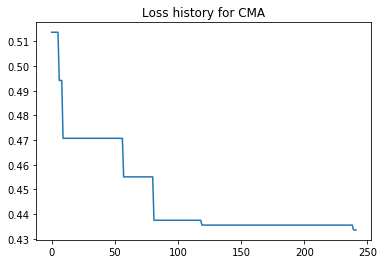


Optimal loss for CMA: 0.43359375
CPU times: user 27min 21s, sys: 4min 58s, total: 32min 20s
Wall time: 20min 14s


In [43]:
%%time
opt_loss_hists, opt_recommendations = find_attacks(turing_optimizers, loss_fun=turing_sr_loss_fun)

In [28]:
print(f"Final loss: {opt_loss_hists['CMA'][-1]}")

NameError: name 'opt_loss_hists' is not defined

In [ ]:
L1_opt, L2_opt, init_opt = opt_recommendations['CMA'].args
init_opt = get_init_maps(init_opt, init_multiplier, tile_init=False)

img_size = tuple(adv_dataset[0][0].shape[-2:])
pattern = generate_pattern(img_size, kernel_N=N, kernel_L1=L1_opt, 
                           kernel_L2=L2_opt, init_maps=init_opt)

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(maps_img(pattern)) 

In [96]:
final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, vgg , n_imgs=10000)
print(f'Final pattern success rate: {final_sr}')


Final pattern success rate: 0.4962


In [97]:
np.save('turing_true_vgg_500_49.npy', pattern)

(-0.5, 223.5, 223.5, -0.5)

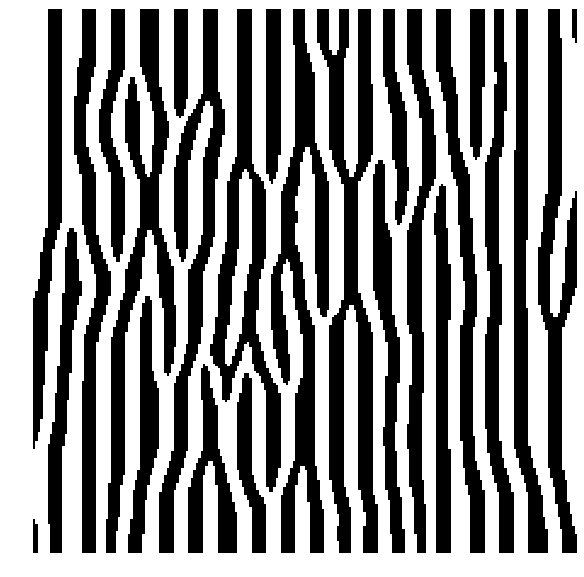

In [130]:
tur_pat1 = np.load('turing_true_51on10000.npy')

plt.figure(figsize=(10, 10))
plt.imshow(maps_img(tur_pat1)) 
plt.axis('off')

In [32]:
def maps_img(maps):
    if maps.shape[0] == 3:
        maps = np.stack(maps, axis=-1)
    return (maps - maps.min()) / (maps.max() - maps.min())

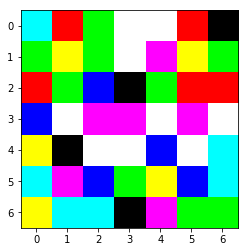

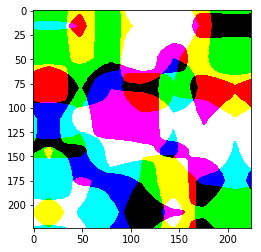

In [66]:
init_opt_nomul = np.sign(opt_recommendations['CMA'].args[-1])
plt.imshow(maps_img(init_opt_nomul))
plt.show()
plt.imshow(maps_img(get_init_maps(opt_recommendations['CMA'].args[-1], init_multiplier, tile_init=False)))
plt.show()

In [68]:
final_sr = 1 - turing_param_loss(*opt_recommendations['CMA'].args, adv_dataset, model=inception,
                              turing_N=N, n_imgs=10000, init_multiplier=init_multiplier, tile_init=False)
print(f'Final pattern success rate: {final_sr}')


Final pattern success rate: 0.44300000000000006


In [28]:
np.save('turing_true_56on10000_resize_vgg.npy', pattern)

In [38]:
final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, n_imgs=10000)
print(f'Final pattern success rate: {final_sr}')


Final pattern success rate: 0.5289


In [ ]:
srs = []
for i in range(10):
    sr = 1 - turing_param_loss(*opt_recommendations['CMA'].args, adv_dataset, 
                                  turing_N=N, n_imgs=1000, init_multiplier=init_multiplier)
    srs.append(sr)
    print(sr)
srs = np.array(srs)
print(srs.mean())


0.547



0.567



0.57



0.545



0.552


In [48]:
srs.mean()

0.5612999999999999

In [34]:
np.save('turing_best2.npy', pattern)

In [89]:
np.save('turing_best.npy', pattern)

In [86]:
print(final_sr)

0.6285


In [71]:
adv_dataset[0][0].shape

torch.Size([3, 224, 224])

In [ ]:
adv = generate_pattern(adv_dataset[0][0].shape[-2:], kernel_L1=11, kernel_L2=9)

## Optimizing Turing convolutional kernel with `nevergrad`

In [15]:
def turing_kernel_loss(kernel, init_maps, adv_dataset, model=mobilenet, n_imgs=100, init_multiplier=3):
    # generate Turing pattern
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    init_maps = get_init_maps(init_maps, init_multiplier)
    adv = generate_pattern(img_size, conv_kernel=kernel, init_maps=init_maps)
    return pattern_sr_loss(adv, adv_dataset, model=model, n_imgs=n_imgs)

In [16]:
N = 13
turing_kernel = ng.var.Array(N, N)
init_map_shape = (3, 7, 7)
init_multiplier = 32
init_maps = ng.var.Array(*init_map_shape)

turing_instrum = ng.Instrumentation(turing_kernel, init_maps)

In [17]:
turing_instrum.dimension

316

In [25]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

turing_sr_loss_fun = partial(turing_kernel_loss, adv_dataset=adv_dataset, model=mobilenet, n_imgs=512, init_multiplier=init_multiplier)
turing_optimizers = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum, budget=250)}

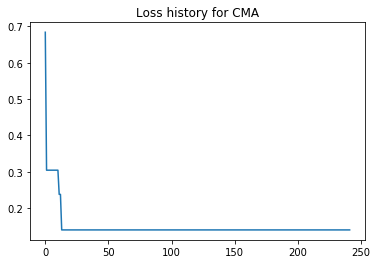


Optimal loss for CMA: 0.140625
CPU times: user 24min 43s, sys: 3min 31s, total: 28min 14s
Wall time: 16min 27s


In [26]:
%%time
opt_loss_hists, opt_recommendations = find_attacks(turing_optimizers, loss_fun=turing_sr_loss_fun)

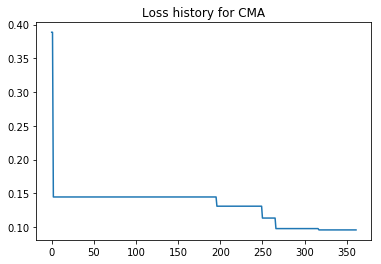

In [ ]:
%%time
opt_model_recs = []
opt_model_losses = []
model_srs = []
for model in [mobilenet, vgg, inception]:
    # optimize pattern
    adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

    turing_sr_loss_fun = partial(turing_kernel_loss, adv_dataset=adv_dataset, model=model, n_imgs=512, init_multiplier=init_multiplier)
    turing_optimizers = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum, budget=500)}
    opt_loss_hists, opt_recommendations = find_attacks(turing_optimizers, loss_fun=turing_sr_loss_fun)
    opt_model_losses.append(opt_loss_hists)
    opt_model_recs.append(opt_recommendations)
    
    # generate pattern and attack
    kernel, init_opt = opt_recommendations['CMA'].args
    init_opt = get_init_maps(init_opt, init_multiplier)

    img_size = tuple(adv_dataset[0][0].shape[-2:])
    pattern = generate_pattern(img_size, conv_kernel=kernel, init_maps=init_opt)
    
    final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, model , n_imgs=10000)
    print(f'Final pattern success rate: {final_sr}')
    model_srs.append(final_sr)

In [35]:
model_srs

[0.9081, 0.7526, 0.5505]

In [40]:
kernel, init_opt = opt_model_recs[2]['CMA'].args
np.save('turing_filter_init_inception_55_500.npy', init_opt)
np.save('turing_filter_kernel_inception_55_500.npy', kernel)
init_opt = get_init_maps(init_opt, init_multiplier)

img_size = tuple(adv_dataset[0][0].shape[-2:])
pattern = generate_pattern(img_size, conv_kernel=kernel, init_maps=init_opt)
np.save('turing_filter_pattern_inception_55_500.npy', pattern)

In [27]:
opt_loss_hists['CMA'][-1]


0.140625

In [28]:
kernel, init_opt = opt_recommendations['CMA'].args
init_opt = get_init_maps(init_opt, init_multiplier)

img_size = tuple(adv_dataset[0][0].shape[-2:])
pattern = generate_pattern(img_size, conv_kernel=kernel, init_maps=init_opt)

In [30]:
final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, mobilenet , n_imgs=10000)
print(f'Final pattern success rate: {final_sr}')


Final pattern success rate: 0.8553


In [31]:
kernel, init_opt = opt_recommendations['CMA'].args

np.save('turing_filter_pattern_mobilenet_85_250.npy', pattern)
np.save('turing_filter_init_mobilenet_85_250.npy', init_opt)
np.save('turing_filter_kernel_mobilenet_85_250.npy', kernel)

In [26]:
p1 = np.load('turing_filter_pattern_inception_54.npy')

In [28]:
1 - pattern_sr_loss(p1, adv_dataset, mobilenet, n_imgs=10000)

0.7317

In [ ]:
np.save('turing_filter_pattern_inception_51.npy')

In [90]:
#load_p = np.load('turing_filter_pattern_95.npy')
load_p = np.load('turing_filter_pattern_75vgg.npy')
final_sr = 1 - pattern_sr_loss(load_p, adv_dataset, inception, n_imgs=10000)
print(f'Final pattern success rate: {final_sr}')


Final pattern success rate: 0.45419999999999994


(-0.5, 223.5, 223.5, -0.5)

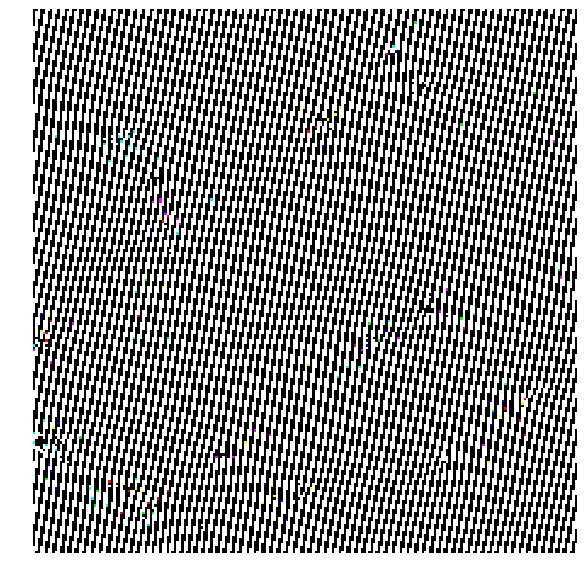

In [24]:
plt.figure(figsize=(10, 10))
plt.imshow(maps_img(pattern))
plt.axis('off')

In [50]:
kernel_95 = np.load('turing_filter_kernel_95.npy')
init_opt_95 = np.load('turing_filter_init_95.npy')
pattern_95 = np.load('turing_filter_pattern_95.npy')

In [ ]:
final_sr = 1 - pattern_sr_loss(pattern_95, adv_dataset, inception, n_imgs=10000)
print(f'Final pattern success rate: {final_sr}')

In [48]:
%%time
final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, vgg, n_imgs=10000)
print(f'Final pattern success rate: {final_sr}')


Final pattern success rate: 0.7541
CPU times: user 2min 26s, sys: 6.09 s, total: 2min 33s
Wall time: 35.7 s


In [49]:
%%time
final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, mobilenet, n_imgs=10000)
print(f'Final pattern success rate: {final_sr}')


Final pattern success rate: 0.691
CPU times: user 2min 12s, sys: 2.71 s, total: 2min 15s
Wall time: 32.5 s


In [17]:
old_pattern = np.load('turing_true_56on10000.npy')

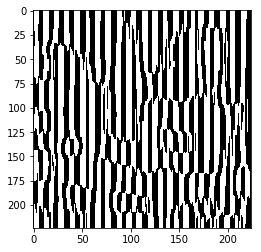

In [18]:
plt.imshow(maps_img(old_pattern))

## Turing filters without `init_map` optimization

In [15]:
def turing_kernel_noinit_loss(kernel, adv_dataset, model=mobilenet, n_imgs=100):
    # generate Turing pattern
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    adv = generate_pattern(img_size, conv_kernel=kernel)
    return pattern_sr_loss(adv, adv_dataset, model=model, n_imgs=n_imgs)

In [16]:
N = 13
turing_kernel = ng.var.Array(N, N)
turing_instrum = ng.Instrumentation(turing_kernel)

adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

turing_sr_noinit_loss_fun = partial(turing_kernel_noinit_loss, adv_dataset=adv_dataset, model=inception, n_imgs=512)
turing_optimizers = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum, budget=400)}

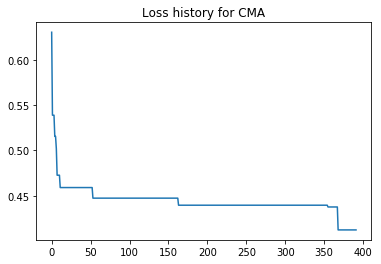


Optimal loss for CMA: 0.412109375
CPU times: user 40min 21s, sys: 9min 34s, total: 49min 55s
Wall time: 38min 34s


In [78]:
%%time
opt_loss_hists, opt_recommendations = find_attacks(turing_optimizers, loss_fun=turing_sr_noinit_loss_fun)

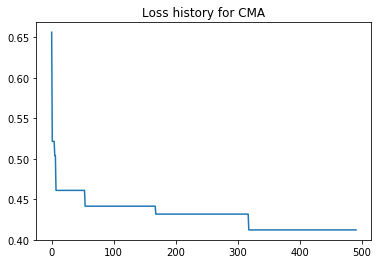


Optimal loss for CMA: 0.412109375



CPU times: user 55min 10s, sys: 10min 7s, total: 1h 5min 17s
Wall time: 54min 49s


In [18]:
%%time
# Test multiple models simultaneously
opt_model_recs = []
opt_model_losses = []
model_srs = []
for model in [inception]:
    # optimize pattern
    adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

    turing_sr_noinit_loss_fun = partial(turing_kernel_noinit_loss, adv_dataset=adv_dataset, model=model, n_imgs=512)
    turing_optimizers = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum, budget=500)}
    opt_loss_hists, opt_recommendations = find_attacks(turing_optimizers, loss_fun=turing_sr_noinit_loss_fun)
    opt_model_losses.append(opt_loss_hists)
    opt_model_recs.append(opt_recommendations)
    
    # generate pattern and attack
    kernel = opt_recommendations['CMA'].args[0]
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    
    final_srs = []
    for i in range(50):
        pattern = generate_pattern(img_size, conv_kernel=kernel)
        final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, model, n_imgs=10000)
        final_srs.append(final_sr)
    final_srs = np.array(final_srs)
    
    model_srs.append(final_srs)
model_srs = np.array(model_srs)

In [123]:
model_srs

array([[0.9442, 0.9445, 0.9504, 0.9448, 0.9486, 0.9533, 0.9465, 0.9464,
        0.9429, 0.9404, 0.9458, 0.9422, 0.9393, 0.945 , 0.9427, 0.9428,
        0.9437, 0.9418, 0.941 , 0.9418, 0.9447, 0.9409, 0.9406, 0.9444,
        0.9452, 0.9427, 0.9387, 0.9438, 0.9487, 0.9434, 0.9501, 0.9437,
        0.9507, 0.9429, 0.9407, 0.9409, 0.9443, 0.9442, 0.9473, 0.9425,
        0.9367, 0.9519, 0.9402, 0.9415, 0.9433, 0.9509, 0.9433, 0.9482,
        0.9434, 0.9403],
       [0.7738, 0.7754, 0.7783, 0.7709, 0.7814, 0.769 , 0.7788, 0.7852,
        0.7705, 0.7606, 0.7703, 0.7823, 0.785 , 0.7796, 0.779 , 0.7709,
        0.7683, 0.7741, 0.7755, 0.7654, 0.7616, 0.7755, 0.7853, 0.7709,
        0.7733, 0.7766, 0.7716, 0.7737, 0.7798, 0.7739, 0.7762, 0.7712,
        0.7828, 0.7766, 0.7785, 0.7752, 0.7799, 0.7761, 0.7756, 0.7722,
        0.7697, 0.7798, 0.7728, 0.7715, 0.7807, 0.7812, 0.7735, 0.7728,
        0.7686, 0.7781],
       [0.5113, 0.5067, 0.5094, 0.5091, 0.5067, 0.5116, 0.5093, 0.5071,
        0.5108

In [47]:
model_srs.mean(axis=1)

array([0.944164, 0.77499 , 0.50963 ])

In [48]:
np.save('turing_filter_noinit_kernel_mobilenet_94_500.npy', opt_model_recs[0]['CMA'].args[0])
np.save('turing_filter_noinit_kernel_vgg_77_500.npy', opt_model_recs[1]['CMA'].args[0])
np.save('turing_filter_noinit_kernel_inception_50_500.npy', opt_model_recs[2]['CMA'].args[0])

In [ ]:
opt_loss_hists['CMA'][-1]

In [ ]:
kernel = opt_recommendations['CMA'].args[0]
img_size = tuple(adv_dataset[0][0].shape[-2:])
pattern = generate_pattern(img_size, conv_kernel=kernel)

plt.figure(figsize=(10, 10))
plt.imshow(maps_img(pattern))
plt.axis('off')
plt.show()

plt.imshow(maps_img(kernel), cmap='gray')
plt.title('Convolutional kernel')
plt.axis('off')
plt.show()

In [35]:
kernel = np.load('turing_filter_noinit_kernel_inception_50_500.npy')

In [38]:
%%time
final_srs = []
for i in range(50):
    pattern = generate_pattern(img_size, conv_kernel=kernel)
    final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, vgg, n_imgs=10000)
    final_srs.append(final_sr)

final_srs = np.array(final_srs)
print(f'Final pattern success rate stats: {final_srs.mean(), final_srs.min(), final_srs.max()}')


Final pattern success rate stats: (0.7753339999999999, 0.7667, 0.7818)
CPU times: user 10min 28s, sys: 5min 46s, total: 16min 15s
Wall time: 18min 1s


In [39]:
print(f'Final pattern success rate stats: {final_srs.mean(), final_srs.min(), final_srs.max()}')

Final pattern success rate stats: (0.7753339999999999, 0.7667, 0.7818)


In [41]:
np.save('turing_filter_noinit_kernel_vgg_77_500.npy', kernel)

In [30]:
inception_53_kernel = kernel

In [40]:
np.save('turing_filter_noinit_kernel_inception_53_500.npy', inception_53_kernel)

### Turing filters with independent channels

```
generate_pattern(
        img_size, conv_kernel=None, n_iterations=20,
        separate_channels=False, kernel_type='2D', pointwise_kernel=None,
        kernel_N=13, kernel_L1=5, kernel_L2=5, init_maps=None)
```

#### 2D filter on completely separate channels

In [16]:
# 2D filter on completely separate channels
N = 13
turing_kernel_2d = ng.var.Array(N, N)
turing_instrum_2d = ng.Instrumentation(turing_kernel_2d)

adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

def turing_kernel_2d_loss(kernel, adv_dataset, model=mobilenet, n_imgs=100):
    # generate Turing pattern
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    adv = generate_pattern(img_size, conv_kernel=kernel, separate_channels=True, kernel_type='2D')
    return pattern_sr_loss(adv, adv_dataset, model=model, n_imgs=n_imgs)

In [17]:
turing_sr_noinit_2d_loss_fun = partial(turing_kernel_2d_loss, adv_dataset=adv_dataset, model=vgg, n_imgs=512)
optimizers_2d = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum_2d, budget=250)}

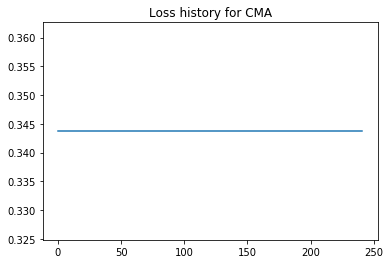


Optimal loss for CMA: 0.34375
CPU times: user 26min 50s, sys: 4min 57s, total: 31min 48s
Wall time: 23min 10s


In [23]:
%%time
opt_loss_hists, opt_recommendations = find_attacks(optimizers_2d, loss_fun=turing_sr_noinit_2d_loss_fun)

In [24]:
kernel_2d = opt_recommendations['CMA'].args[0]
img_size = tuple(adv_dataset[0][0].shape[-2:])

final_srs = []
for i in range(50):
    pattern = generate_pattern(img_size, conv_kernel=kernel_2d, separate_channels=True, kernel_type='2D')
    final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, vgg, n_imgs=10000)
    final_srs.append(final_sr)
final_srs = np.array(final_srs)

In [25]:
print(final_srs.mean())

0.606288


In [26]:
np.save(f'turing_filter_noinit_2d_vgg_{int(final_srs.mean() * 100)}_500.npy', kernel_2d)

In [31]:
def develop_2d_attacks(models, model_names, adv_dataset, budget_step=250, budget_max=500, save=True):
    opt_model_recs = []
    opt_model_losses = []
    model_srs = []
    for model, model_name in zip(models, model_names):
        # optimize pattern
        turing_kernel_2d = ng.var.Array(N, N)
        turing_instrum_2d = ng.Instrumentation(turing_kernel_2d)

        adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                      adv_addition='resized')

        turing_sr_noinit_2d_loss_fun = partial(turing_kernel_2d_loss, adv_dataset=adv_dataset, model=model, n_imgs=512)
        optimizers_2d = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum_2d, budget=budget_step)}
        # make budget steps
        budget_srs = []
        for j in range(budget_step, budget_max + 1, budget_step):
            # find attacks
            opt_loss_hists, opt_recommendations = find_attacks(optimizers_2d, loss_fun=turing_sr_noinit_2d_loss_fun)
            opt_model_losses.append(opt_loss_hists)
            opt_model_recs.append(opt_recommendations)

            # generate pattern and attack
            kernel_2d = opt_recommendations['CMA'].args[0]
            img_size = tuple(adv_dataset[0][0].shape[-2:])

            final_srs = []
            for i in range(50):
                pattern = generate_pattern(img_size, conv_kernel=kernel_2d, separate_channels=True, kernel_type='2D')
                final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, model, n_imgs=10000)
                final_srs.append(final_sr)
            final_srs = np.array(final_srs)
            budget_srs.append(final_srs)
            
            if save:
                np.save(f'turing_filter_noinit_2d_{model_name}_{int(final_srs.mean() * 100)}_{j}.npy', kernel_2d)
        model_srs.append(budget_srs)
    model_srs = np.array(model_srs)
    return model_srs

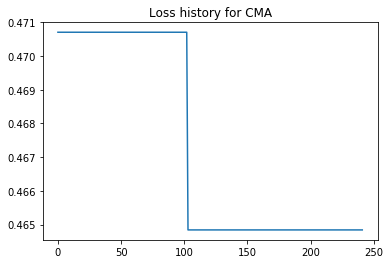


Optimal loss for CMA: 0.46484375


In [32]:
model_srs = develop_2d_attacks([inception], ['inception'], adv_dataset)

In [30]:
model_srs.shape

NameError: name 'model_srs' is not defined

#### 3D-filter on completely separate channels

In [33]:
# 3D-filter on completely separate channels
turing_kernel_3d = ng.var.Array(N, N, 3)
turing_instrum_3d = ng.Instrumentation(turing_kernel_3d)

def turing_kernel_3d_loss(kernel, adv_dataset, model=mobilenet, n_imgs=100):
    # generate Turing pattern
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    adv = generate_pattern(img_size, conv_kernel=kernel, separate_channels=True, kernel_type='3D')
    return pattern_sr_loss(adv, adv_dataset, model=model, n_imgs=n_imgs)

In [31]:
turing_sr_noinit_3d_loss_fun = partial(turing_kernel_3d_loss, adv_dataset=adv_dataset, model=mobilenet, n_imgs=512)
optimizers_3d = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum_3d, budget=250)}

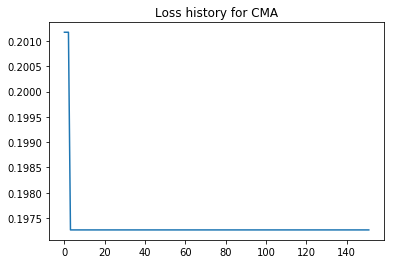

In [ ]:
%%time
opt_loss_hists, opt_recommendations = find_attacks(optimizers_3d, loss_fun=turing_sr_noinit_3d_loss_fun)

In [ ]:
kernel_3d = opt_recommendations['CMA'].args[0]
img_size = tuple(adv_dataset[0][0].shape[-2:])

final_srs_3d = []
for i in range(50):
    pattern = generate_pattern(img_size, conv_kernel=kernel_3d, separate_channels=True, kernel_type='3D')
    final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, mobilenet, n_imgs=10000)
    final_srs_3d.append(final_sr)
final_srs_3d = np.array(final_srs_3d)

In [42]:
from math import floor

In [50]:
print(floor(final_srs_3d.mean() * 100))

83


In [ ]:
np.save(f'turing_filter_noinit_3d_mobilenet_{floor(final_srs_3d.mean() * 100)}_500.npy', kernel_3d)

In [38]:
def develop_3d_attacks(models, model_names, adv_dataset, budget_step=250, budget_max=500, save=True):
    opt_model_recs = []
    opt_model_losses = []
    model_srs = []
    for model, model_name in zip(models, model_names):
        # optimize pattern
        turing_kernel_3d = ng.var.Array(N, N, 3)
        turing_instrum_3d = ng.Instrumentation(turing_kernel_3d)

        turing_sr_noinit_3d_loss_fun = partial(turing_kernel_3d_loss, adv_dataset=adv_dataset, model=model, n_imgs=512)
        optimizers_3d = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum_3d, budget=budget_step)}
        # make budget steps
        budget_srs = []
        for j in range(budget_step, budget_max + 1, budget_step):
            # find attacks
            opt_loss_hists, opt_recommendations = find_attacks(optimizers_3d, loss_fun=turing_sr_noinit_3d_loss_fun)
            opt_model_losses.append(opt_loss_hists)
            opt_model_recs.append(opt_recommendations)

            # generate pattern and attack
            
            kernel_3d = opt_recommendations['CMA'].args[0]
            img_size = tuple(adv_dataset[0][0].shape[-2:])

            final_srs_3d = []
            for i in range(50):
                pattern = generate_pattern(img_size, conv_kernel=kernel_3d, separate_channels=True, kernel_type='3D')
                final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, model, n_imgs=10000)
                final_srs_3d.append(final_sr)
            final_srs_3d = np.array(final_srs_3d)
            budget_srs.append(final_srs_3d)
            
            if save:
                np.save(f'turing_filter_noinit_3d_{model_name}_{int(final_srs_3d.mean() * 100)}_{j}.npy', kernel_3d)
        model_srs.append(budget_srs)
    model_srs = np.array(model_srs)
    return model_srs

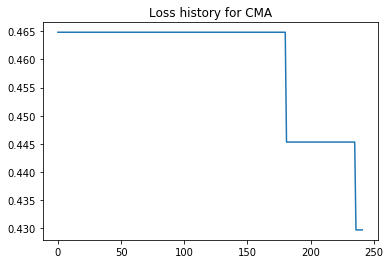


Optimal loss for CMA: 0.4296875


In [39]:
model_srs_3d = develop_3d_attacks(models, ['mobilenet', 'vgg', 'inception'], adv_dataset)

####  3 2D-filters then 1x1 convolution (3x3 matrix)opt_loss_hists


In [49]:
# 3 2D-filters then 1x1 convolution (3x3 matrix)opt_loss_hists
turing_kernels = ng.var.Array(N, N, 3)
turing_pointwise = ng.var.Array(3, 3)
turing_instrum_pw = ng.Instrumentation(turing_kernels, turing_pointwise)

def turing_kernel_pw_loss(kernels, pointwise, adv_dataset, model=mobilenet, n_imgs=100):
    # generate Turing pattern
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    adv = generate_pattern(img_size, conv_kernel=kernels, separate_channels=True, 
                           kernel_type='pointwise', pointwise_kernel=pointwise)
    return pattern_sr_loss(adv, adv_dataset, model=model, n_imgs=n_imgs)

In [71]:
turing_sr_noinit_pw_loss_fun = partial(turing_kernel_pw_loss, adv_dataset=adv_dataset, model=vgg, n_imgs=512)
optimizers_pw = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum_pw, budget=250)}

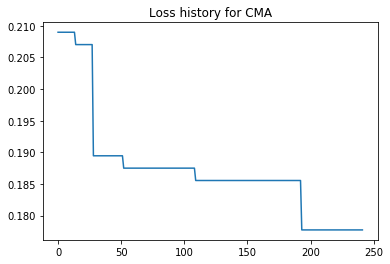


Optimal loss for CMA: 0.177734375
CPU times: user 20min 22s, sys: 3min 16s, total: 23min 38s
Wall time: 17min 31s


In [76]:
%%time
opt_loss_hists, opt_recommendations = find_attacks(optimizers_pw, loss_fun=turing_sr_noinit_pw_loss_fun)

In [77]:
kernels_pw, pointwise = opt_recommendations['CMA'].args
img_size = tuple(adv_dataset[0][0].shape[-2:])

final_srs_pw = []
for i in range(50):
    pattern = generate_pattern(img_size, conv_kernel=kernels_pw, separate_channels=True, 
                               kernel_type='pointwise', pointwise_kernel=pointwise)
    final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, vgg, n_imgs=10000)
    final_srs_pw.append(final_sr)
final_srs_pw = np.array(final_srs_pw)

In [ ]:
from math import floor

In [78]:
print(final_srs_pw.mean())

0.7799320000000002


In [79]:
np.save(f'turing_filter_noinit_pw_vgg_{floor(final_srs_pw.mean() * 100)}_500.npy', kernels_pw)
np.save(f'turing_filter_noinit_pw_vgg_{floor(final_srs_pw.mean() * 100)}_p_500.npy', pointwise)

In [57]:
import turing
del turing
import importlib
import turing
turing = importlib.reload(turing)
from turing import generate_pattern

### Turing filters for ranging filter size

In [ ]:
1

In [ ]:
turing_kernel_loss()

In [ ]:
%%time 
N_range = range(3, 25)

loss_hists = []
recs = []

for N in tqdm(N_range):
    turing_kernel = ng.var.Array(N, N)
    init_map_shape = (3, 7, 7)
    init_multiplier = 32
    init_maps = ng.var.Array(*init_map_shape)

    turing_instrum = ng.Instrumentation(turing_kernel, init_maps)
    adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                      adv_addition='resized')
    turing_sr_loss_fun = partial(turing_kernel_loss, adv_dataset=adv_dataset, model=mobilenet, 
                                        n_imgs=512, init_multiplier=init_multiplier)
    turing_optimizers = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum, budget=250)}

    opt_loss_hists, opt_recommendations = find_attacks(turing_optimizers, loss_fun=turing_sr_loss_fun)
    loss_hists.append(opt_loss_hists)
    recs.append(opt_recommendations)

In [ ]:
[loss_hists[i]['CMA'][-1] for i in range(len(loss_hists))]

In [ ]:
%%time 

adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')
srs = []
for rec in recs:
    kernel, init_opt = rec['CMA'].args
    init_opt = get_init_maps(init_opt, init_multiplier)
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    pattern = generate_pattern(img_size, conv_kernel=kernel, init_maps=init_opt)

    rec_srs = []
    for i in range(10):
        
        sr = 1 - pattern_sr_loss(pattern, adv_dataset, mobilenet, n_imgs=10000)
        #print(f'Final pattern success rate: {final_sr}')
        rec_srs.append(sr)
    rec_srs = np.array(rec_srs)
    srs.append(rec_srs)

In [ ]:
srs = np.array(srs)

In [ ]:
srs.mean(axis=1)

In [ ]:
plt.plot(N_range, srs.mean(axis=1), c='green')
#plt.plot(N_range, srs.min(axis=1), c='red')
#plt.plot(N_range, srs.max(axis=1), c='red')

plt.xticks(N_range)
plt.title('Optimizing filter and initialization')
plt.show()

### without init

In [51]:
N_range = range(3, 25)

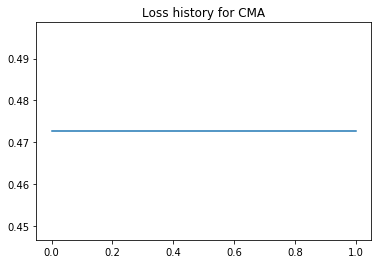

In [ ]:
%%time 


noinit_loss_hists = []
noinit_recs = []

for N in tqdm(N_range):
    turing_kernel = ng.var.Array(N, N)
    turing_instrum = ng.Instrumentation(turing_kernel)
    adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                      adv_addition='resized')

    turing_sr_noinit_loss_fun = partial(turing_kernel_noinit_loss, adv_dataset=adv_dataset, model=inception, n_imgs=512)
    turing_optimizers = {'CMA': ng.optimizers.CMA(instrumentation=turing_instrum, budget=250)}

    opt_loss_hists, opt_recommendations = find_attacks(turing_optimizers, loss_fun=turing_sr_noinit_loss_fun)
    noinit_loss_hists.append(opt_loss_hists)
    noinit_recs.append(opt_recommendations)
    
noinit_recs = np.array(noinit_recs)

In [ ]:
noinit_recs[0]['CMA'].args

In [ ]:
%%time 

adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')
noinit_srs = []
for rec in noinit_recs:
    kernel = rec['CMA'].args[0]
    rec_srs = []
    for i in range(10):
        pattern = generate_pattern(img_size, conv_kernel=kernel)
        sr = 1 - pattern_sr_loss(pattern, adv_dataset, mobilenet, n_imgs=10000)
        rec_srs.append(sr)
    rec_srs = np.array(rec_srs)
    noinit_srs.append(rec_srs)
noinit_srs = np.array(noinit_srs)

In [ ]:
1

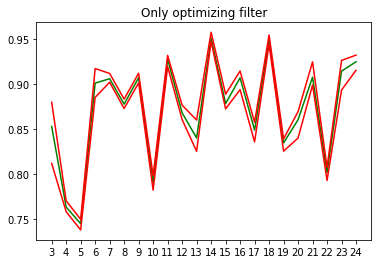

In [99]:
plt.plot(N_range, noinit_srs.mean(axis=1), c='green')
plt.plot(N_range, noinit_srs.min(axis=1), c='red')
plt.plot(N_range, noinit_srs.max(axis=1), c='red')

plt.xticks(N_range)
plt.title('Only optimizing filter')
plt.show()

In [ ]:
1

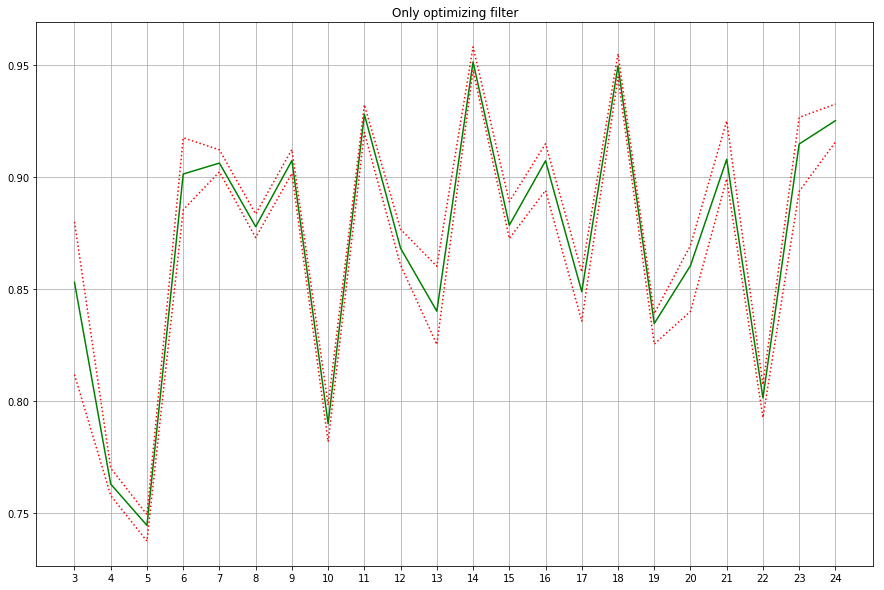

In [54]:
plt.figure(figsize=(15,10))
plt.plot(N_range, noinit_srs.mean(axis=1), c='green')
plt.plot(N_range, noinit_srs.min(axis=1), c='red', linestyle=':')
plt.plot(N_range, noinit_srs.max(axis=1), c='red', linestyle=':')

plt.xticks(N_range)
plt.title('Only optimizing filter')
plt.grid()
plt.show()

In [53]:
noinit_srs = np.load('ranging_filter_size_noinit_srs.npy')

In [55]:
noinit_srs.shape

(22, 10)

In [112]:
np.save('ranging_filter_size_noinit_srs.npy', noinit_srs)

# Transferability

In [18]:
def attack_models(patterns, models, adv_dataset, pattern_names=None, model_names=None, n_imgs=10000):
    if pattern_names is None:
        pattern_names = range(len(patterns))
    if model_names is None:
        model_names = range(len(models))
        
    attack_srs = pd.DataFrame(index=pattern_names, columns=model_names)
    for pattern, pattern_name in zip(patterns, pattern_names):
        for model, model_name in zip(models, model_names):
            attack_srs.loc[pattern_name, model_name] = 1 - pattern_sr_loss(pattern, adv_dataset, model, n_imgs=n_imgs)
    print(attack_srs)
    return attack_srs

def generate_from_kernels(kernels, img_size, init_maps=None, n_per_kernel=1):
    patterns = []
    for kernel in kernels:
        for i in range(n_per_kernel):
            pattern = generate_pattern(img_size, init_maps=init_maps, conv_kernel=kernel)
            patterns.append(pattern)
    return patterns

In [19]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

In [ ]:
n_per_kernel = 3
kernels = [np.load('turing_filter_kernel_noinit_87_mobilenet.npy'), 
           np.load('turing_filter_kernel_noinit_68_vgg.npy'), 
           np.load('turing_filter_kernel_noinit_51_inception400.npy')]
patterns = generate_from_kernels(kernels, img_size, n_per_kernel=n_per_kernel)

pattern_names = [f'{model_names[j]} {i}' for j in range(len(model_names)) for i in range(3)]
pattern_names

In [ ]:
attack_res = attack_models(patterns, models, adv_dataset, pattern_names, model_names)

In [ ]:
attack_res

### Random Turing 

In [56]:
[1] * 3

[1, 1, 1]

In [59]:
# True Turing
true_patterns = os.listdir('turing_224_true/')
#pattern_indices = np.random.choice(range(len(true_patterns)), 15, replace=False)

random_srs = []
#for i in pattern_indices:
for i in range(len(true_patterns)):
    pattern = np.load(f'turing_224_true/{true_patterns[i]}')
    patterns = [pattern] * 3

    random_srs.append(attack_models(patterns, models, adv_dataset, pattern_names, model_names))


            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.5516  0.5496      0.4303
VGG-19           0.5471  0.5561      0.4198
InceptionV3      0.5545  0.5553      0.4234



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.5267  0.5145      0.4709
VGG-19           0.5352  0.5144      0.4559
InceptionV3      0.5343  0.5147      0.4735



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.4643  0.4567       0.442
VGG-19           0.4527  0.4548      0.4416
InceptionV3      0.4664  0.4566      0.4518



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2       0.534  0.5067      0.4755
VGG-19           0.5274   0.498       0.474
InceptionV3      0.5365  0.4972      0.4732



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.5405  0.5666      0.4265
VGG-19            0.545  0.5573      0.4301
InceptionV3      0.5458  0.5608      0.4328



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.5301    0.51      0.5079
VGG-19           0.5325  0.5056       0.506
InceptionV3      0.5347  0.5145      0.5075



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.6051  0.6276      0.4478
VGG-19           0.6059  0.6238      0.4447
InceptionV3      0.5994  0.6225      0.4369



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.4917   0.475      0.4745
VGG-19            0.499  0.4824      0.4814
InceptionV3      0.4937  0.4816      0.4677



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.4557  0.4527      0.4298
VGG-19           0.4642  0.4508      0.4337
InceptionV3      0.4671  0.4504       0.425



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.5017  0.5024      0.5068
VGG-19           0.4999   0.497      0.4948
InceptionV3         0.5   0.502      0.5031



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.6131  0.6443      0.4501
VGG-19           0.6108  0.6362        0.46
InceptionV3      0.6141  0.6334      0.4669



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.4993  0.4797      0.4613
VGG-19           0.5097  0.4798      0.4645
InceptionV3       0.498  0.4762      0.4624



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2       0.456  0.4466      0.4275
VGG-19            0.459  0.4476      0.4332
InceptionV3       0.456   0.445      0.4326



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.6078  0.6148      0.4464
VGG-19            0.599  0.6203      0.4368
InceptionV3      0.5996  0.6148      0.4416



            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.5411  0.5685      0.4236
VGG-19           0.5529  0.5608      0.4218
InceptionV3      0.5463  0.5588      0.4349


In [64]:
random_srs[0]

,MobileNetV2,VGG-19,InceptionV3
MobileNetV2,0.5516,0.5496,0.4303
VGG-19,0.5471,0.5561,0.4198
InceptionV3,0.5545,0.5553,0.4234


In [63]:
(sum(random_srs) / 15) * 100

,MobileNetV2,VGG-19,InceptionV3
MobileNetV2,52.7913,52.7713,45.4727
VGG-19,52.9353,52.566,45.322
InceptionV3,52.976,52.5587,45.5553


### True Turing 

In [33]:
# True Turing
patterns = [np.load(f'{npy_prefix}/turing_true_mobilenet_250_50.npy'),
            np.load(f'{npy_prefix}/turing_true_vgg_250_53.npy'),
            np.load(f'{npy_prefix}/turing_true_inception_250_45.npy'),
           ]

attack_srs = attack_models(patterns, models, adv_dataset, pattern_names, model_names)


            MobileNetV2  VGG-19 InceptionV3
MobileNetV2       0.505  0.5067      0.4769
VGG-19           0.5543  0.5543      0.4504
InceptionV3      0.5003  0.4866       0.462


In [35]:
(attack_srs * 100).to_csv('transferability_true_250.csv')

In [40]:
# True Turing
patterns = [np.load(f'{npy_prefix}/turing_true_mobilenet_500_56.npy'),
            np.load(f'{npy_prefix}/turing_true_vgg_500_49.npy'),
            np.load(f'{npy_prefix}/turing_true_inception_500_47.npy'),
           ]

attack_srs500 = attack_models(patterns, models, adv_dataset, pattern_names, model_names)


            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.5615  0.5696      0.4516
VGG-19           0.5049  0.5006      0.4998
InceptionV3      0.4955  0.4876      0.4718


In [41]:
(attack_srs500 * 100).to_csv('transferability_true_500.csv')

### With init

In [22]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

patterns250 = [np.load(f'{npy_prefix}/turing_filter_pattern_mobilenet_85_250.npy'),
               np.load(f'{npy_prefix}/turing_filter_pattern_vgg_79_250.npy'),
               np.load(f'{npy_prefix}/turing_filter_pattern_inception_52_250.npy')]
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']
pattern_names = model_names
attack_res250 = attack_models(patterns250, models, adv_dataset, pattern_names, model_names)


            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.8572   0.615      0.3755
VGG-19           0.7023  0.7956      0.3913
InceptionV3      0.6004  0.6358       0.524


In [36]:
(attack_res250 * 100).to_csv('transferability_filter_250.csv')

In [37]:
patterns500 = [np.load(f'{npy_prefix}/turing_filter_pattern_mobilenet_91_500.npy'),
               np.load(f'{npy_prefix}/turing_filter_pattern_vgg_75_500.npy'),
               np.load(f'{npy_prefix}/turing_filter_pattern_inception_55_500.npy')]
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']
pattern_names = model_names
attack_res500 = attack_models(patterns500, models, adv_dataset, pattern_names, model_names)


            MobileNetV2  VGG-19 InceptionV3
MobileNetV2      0.9059  0.6127      0.3515
VGG-19           0.6215  0.7564      0.3191
InceptionV3      0.6569   0.764      0.5393


In [38]:
(attack_res500 * 100).to_csv('transferability_filter_500.csv')

In [ ]:
np.mean([.5223, .522, .5243])

### Without init

In [18]:
def attack_models_noinit(kernel_files, models, adv_dataset, n_per_kernel=3, 
                         separate_channels=False, kernel_type='2D',
                         kernel_names=None, model_names=None, n_imgs=10000):
    if kernel_names is None:
        kernel_names = range(len(kernel_files))
    if model_names is None:
        model_names = range(len(models))
    
    img_size = tuple(adv_dataset[0][0].shape[-2:])
    attack_srs = pd.DataFrame(index=kernel_names, columns=model_names)
    for kernel_file, kernel_name in zip(kernel_files, kernel_names):
        # load pattern kernel
        if kernel_type == 'pointwise':
            kernel = np.load(kernel_file[0])
            pointwise = np.load(kernel_file[1])
        else:
            kernel = np.load(kernel_file)
            pointwise = None
        
        # average result across several initializations
        kernel_srs = []
        for i in range(n_per_kernel):
            pattern = generate_pattern(img_size, conv_kernel=kernel, separate_channels=separate_channels, 
                                        kernel_type=kernel_type, pointwise_kernel=pointwise)
            pattern_srs = []
            for model in models:
                pattern_srs.append(1 - pattern_sr_loss(pattern, adv_dataset, model, n_imgs=n_imgs))
            kernel_srs.append(pattern_srs)
        kernel_srs = np.array(kernel_srs)
        attack_srs.loc[kernel_name] = kernel_srs.mean(axis=0)
                
    print(attack_srs)
    return attack_srs

In [46]:
def generate_patterns_noinit(kernel_files, img_size, n_per_kernel=3, 
                             separate_channels=False, kernel_type='2D'):
    patterns = []
    for kernel_file in kernel_files:
        # load pattern kernel
        if kernel_type == 'pointwise':
            kernel = np.load(kernel_file[0])
            pointwise = np.load(kernel_file[1])
        else:
            kernel = np.load(kernel_file)
            pointwise = None
        
        # generate several patterns
        for i in range(n_per_kernel):
            pattern = generate_pattern(img_size, conv_kernel=kernel, separate_channels=separate_channels, 
                                        kernel_type=kernel_type, pointwise_kernel=pointwise)
            patterns.append(pattern)
    return patterns

In [19]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

### Nurislam mixing 

In [105]:
kernel_files = ['turing_filter_noinit_kernel_mobilenet_94_500.npy', 
                'turing_filter_noinit_kernel_vgg_77_500.npy', 
                'turing_filter_noinit_kernel_inception_53_500.npy',
                ]
kernel_names = ['OG MobileNet', 'OG VGG', 'OG Inception']
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

attack_srs_og = attack_models_noinit(kernel_files, models, adv_dataset, 
                                                  n_per_kernel=50, separate_channels=False,
                                                  kernel_names=kernel_names, model_names=model_names)


             MobileNetV2   VGG-19 InceptionV3
OG MobileNet     0.94467  0.57685     0.35168
OG VGG           0.73213  0.77611      0.4297
OG Inception     0.63859  0.64507     0.53229


In [113]:
attack_srs_og * 100

,MobileNetV2,VGG-19,InceptionV3
OG MobileNet,94.467,57.685,35.168
OG VGG,73.213,77.611,42.97
OG Inception,63.859,64.507,53.229


In [ ]:
(attack_srs_og * 100).to_csv('transferability_noinit_500.csv')

In [ ]:
kernel_files = ['turing_filter_noinit_kernel_mobilenet_91_250.npy', 
                'turing_filter_noinit_kernel_vgg_77_250.npy', 
                'turing_filter_noinit_kernel_inception_53_250.npy',
                ]
kernel_names = ['OG MobileNet', 'OG VGG', 'OG Inception']
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

attack_srs_og250 = attack_models_noinit(kernel_files, models, adv_dataset, 
                                                  n_per_kernel=50, separate_channels=False,
                                                  kernel_names=kernel_names, model_names=model_names)

In [114]:
attack_srs_og250 * 100

,MobileNetV2,VGG-19,InceptionV3
OG MobileNet,91.6726,61.4032,35.0506
OG VGG,75.238,76.9448,44.013
OG Inception,60.2998,71.8066,53.7154


### 2D

In [21]:
kernel_files = ['turing_filter_noinit_2d_mobilenet_63_250.npy',
                'turing_filter_noinit_2d_vgg_60_250.npy',
                'turing_filter_noinit_2d_mobilenet_63_250.npy',
               ]
kernel_names = ['2D MobileNet', '2D VGG', '2D Inception']
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

srs_2d_250 = attack_models_noinit(kernel_files, models, adv_dataset, n_per_kernel=50, 
                                  separate_channels=True, kernel_type='2D', 
                                  kernel_names=kernel_names, model_names=model_names)


             MobileNetV2    VGG-19 InceptionV3
2D MobileNet    0.636588   0.61649    0.441852
2D VGG          0.621162  0.606658    0.478396
2D Inception    0.634186  0.614714    0.438224


In [25]:
srs_2d_250 * 100

,MobileNetV2,VGG-19,InceptionV3
2D MobileNet,63.6588,61.649,44.1852
2D VGG,62.1162,60.6658,47.8396
2D Inception,63.4186,61.4714,43.8224


In [35]:
(srs_2d_250 * 100).to_csv('transferability_noinit_2d_250.csv')

In [22]:
kernel_files = ['turing_filter_noinit_2d_mobilenet_61_500.npy',
                'turing_filter_noinit_2d_vgg_60_500.npy',
                'turing_filter_noinit_2d_inception_47_500.npy',
               ]
kernel_names = ['2D MobileNet', '2D VGG', '2D Inception']
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

srs_2d_500 = attack_models_noinit(kernel_files, models, adv_dataset, n_per_kernel=50, 
                                  separate_channels=True, kernel_type='2D', 
                                  kernel_names=kernel_names, model_names=model_names)


             MobileNetV2    VGG-19 InceptionV3
2D MobileNet    0.608744  0.450024     0.37486
2D VGG          0.619944   0.60736     0.47759
2D Inception     0.53217  0.545382    0.474462


In [26]:
srs_2d_500 * 100

,MobileNetV2,VGG-19,InceptionV3
2D MobileNet,60.8744,45.0024,37.486
2D VGG,61.9944,60.736,47.759
2D Inception,53.217,54.5382,47.4462


In [36]:
(srs_2d_500 * 100).to_csv('transferability_noinit_2d_500.csv')

### 3D

In [26]:
kernel_files = [f'{npy_prefix}/turing_filter_noinit_3d_mobilenet_78_250.npy',
                f'{npy_prefix}/turing_filter_noinit_3d_vgg_78_250.npy',
                f'{npy_prefix}/turing_filter_noinit_3d_inception_46_250.npy',
               ]
kernel_names = ['3D MobileNet', '3D VGG', '3D Inception']
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

srs_3d_250 = attack_models_noinit(kernel_files, models, adv_dataset, n_per_kernel=50, 
                                  separate_channels=True, kernel_type='3D', 
                                  kernel_names=kernel_names, model_names=model_names)


             MobileNetV2    VGG-19 InceptionV3
3D MobileNet    0.781534  0.672068    0.453378
3D VGG          0.763904  0.780564    0.435886
3D Inception     0.69007  0.726204    0.460034


In [27]:
srs_3d_250 * 100

,MobileNetV2,VGG-19,InceptionV3
3D MobileNet,78.1534,67.2068,45.3378
3D VGG,76.3904,78.0564,43.5886
3D Inception,69.007,72.6204,46.0034


In [28]:
(srs_3d_250 * 100).to_csv('transferability_noinit_3d_250.csv')

In [30]:
kernel_files = [f'{npy_prefix}/turing_filter_noinit_3d_mobilenet_81_500.npy',
                f'{npy_prefix}/turing_filter_noinit_3d_vgg_78_500.npy',
                f'{npy_prefix}/turing_filter_noinit_3d_inception_51_500.npy',
               ]
kernel_names = ['3D MobileNet', '3D VGG', '3D Inception']
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

srs_3d_500 = attack_models_noinit(kernel_files, models, adv_dataset, n_per_kernel=50, 
                                  separate_channels=True, kernel_type='3D', 
                                  kernel_names=kernel_names, model_names=model_names)


             MobileNetV2    VGG-19 InceptionV3
3D MobileNet    0.819666   0.68302    0.482372
3D VGG          0.761546  0.788688     0.43834
3D Inception     0.61355  0.616164     0.51306


In [31]:
(srs_3d_500 * 100).to_csv('transferability_noinit_3d_500.csv')

### PointWise

In [109]:
kernel_files = [('turing_filter_noinit_pw_mobilenet_94_250.npy', 'turing_filter_noinit_pw_mobilenet_94_p_250.npy'), 
                ('turing_filter_noinit_pw_vgg_76_250.npy', 'turing_filter_noinit_pw_vgg_76_p_250.npy'), 
                ('turing_filter_noinit_pw_inception_51_250.npy', 'turing_filter_noinit_pw_inception_51_p_250.npy'),
                ]
kernel_names = ['PW MobileNet', 'PW VGG', 'PW Inception']
models = [mobilenet, vgg, inception]
model_names = ['MobileNetV2', 'VGG-19', 'InceptionV3']

attack_srs_pw = attack_models_noinit(kernel_files, models, adv_dataset, n_per_kernel=10, 
                                     separate_channels=True, kernel_type='pointwise', 
                                     kernel_names=kernel_names, model_names=model_names)

/workspace/turing.py:52: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif channel_mixing == '3D':



             MobileNetV2   VGG-19 InceptionV3
PW MobileNet     0.94377  0.57265     0.34934
PW VGG           0.75778  0.76598     0.43992
PW Inception     0.57462  0.63689     0.51811


In [ ]:
attack_srs_pw

In [110]:
print(attack_srs_pw * 100 )

             MobileNetV2  VGG-19 InceptionV3
PW MobileNet      94.377  57.265      34.934
PW VGG            75.778  76.598      43.992
PW Inception      57.462  63.689      51.811


In [111]:
(attack_srs_pw * 100).to_csv('transferability_noinit_pw_250.csv')

In [119]:
kernel = np.load('turing_filter_noinit_kernel_inception_50_500.npy')

In [127]:
kernel = opt_model_recs[2]['CMA'].args[0]

In [128]:
%%time
final_srs = []
for i in range(50):
    pattern = generate_pattern(img_size, conv_kernel=kernel)
    final_sr = 1 - pattern_sr_loss(pattern, adv_dataset, inception, n_imgs=10000)
    final_srs.append(final_sr)

final_srs = np.array(final_srs)
print(f'Final pattern success rate stats: {final_srs.mean(), final_srs.min(), final_srs.max()}')


Final pattern success rate stats: (0.42997, 0.42090000000000005, 0.43979999999999997)
CPU times: user 5min 31s, sys: 2min 33s, total: 8min 4s
Wall time: 22min 29s


In [130]:
final_srs.mean()

0.42997

In [1]:
len(opt_model_recs)

NameError: name 'opt_model_recs' is not defined

# DFT patterns

### Generate DFT patterns and count their SRs

In [89]:
import importlib
import turing_dft
turing_dft = importlib.reload(turing_dft)

In [50]:
from turing_dft import DFT_matrix, df, new_dft_patterns

In [25]:
adv_dataset = AdversarialImageNet(imagenet_path, tensor_transform=True, 
                                  adv_addition='resized')

img_size = tuple(adv_dataset[0][0].shape[-2:])

In [44]:
import glob

In [18]:
dft_srs = []
for model, model_name in zip(models, model_names):
    model_srs = []
    for i in tqdm(range(50)):
        pat_name = glob.glob(f'{npy_prefix}/{model_name}_*_{i}.npy')[0]
        sr_og = float(pat_name.split('_')[-2])
        pattern = np.load(pat_name)
        
        p1, p2 = new_dft_patterns(pattern)
        
        sr_p1 = 1 - pattern_sr_loss(p1, adv_dataset, model, n_imgs=10000)
        sr_p2 = 1 - pattern_sr_loss(p2, adv_dataset, model, n_imgs=10000)
        model_srs.append([sr_og, sr_p1, sr_p2])
    dft_srs.append(model_srs)
dft_srs = np.array(dft_srs)

In [22]:
dft_srs.mean(axis=1)

array([[0.945106, 0.949494, 0.949734],
       [0.77534 , 0.78011 , 0.779652],
       [0.53116 , 0.506134, 0.51014 ]])

In [36]:
np.save('dft_patterns_srs.npy', dft_srs)

### Generate PW DFT patterns and their SRs

In [47]:
kernel_files = [(f'{npy_prefix}/turing_filter_noinit_pw_mobilenet_94_500.npy', f'{npy_prefix}/turing_filter_noinit_pw_mobilenet_94_p_500.npy'), 
                (f'{npy_prefix}/turing_filter_noinit_pw_vgg_77_500.npy', f'{npy_prefix}/turing_filter_noinit_pw_vgg_77_p_500.npy'), 
                (f'{npy_prefix}/turing_filter_noinit_pw_inception_53_500.npy', f'{npy_prefix}/turing_filter_noinit_pw_inception_53_p_500.npy'),
                ]

patterns = generate_patterns_noinit(kernel_files, img_size, n_per_kernel=50,
                                    separate_channels=True, kernel_type='pointwise')

In [48]:
pats = [patterns[:50], patterns[50:100], patterns[100:]]
patterns = pats

In [37]:
dft_pw_srs = []
for model, pats in zip(models, patterns):
    model_srs = []
    for pattern in pats:
        sr_og = 1 - pattern_sr_loss(pattern, adv_dataset, model, n_imgs=10000)
        p1, p2 = new_dft_patterns(pattern)
        
        sr_p1 = 1 - pattern_sr_loss(p1, adv_dataset, model, n_imgs=10000)
        sr_p2 = 1 - pattern_sr_loss(p2, adv_dataset, model, n_imgs=10000)
        model_srs.append([sr_og, sr_p1, sr_p2])
    dft_pw_srs.append(model_srs)
dft_pw_srs = np.array(dft_pw_srs)

In [40]:
dft_pw_srs.mean(axis=1) * 100

array([[94.5822, 95.1714, 95.1572],
       [78.059 , 77.6608, 77.9554],
       [53.3414, 53.6128, 53.4834]])

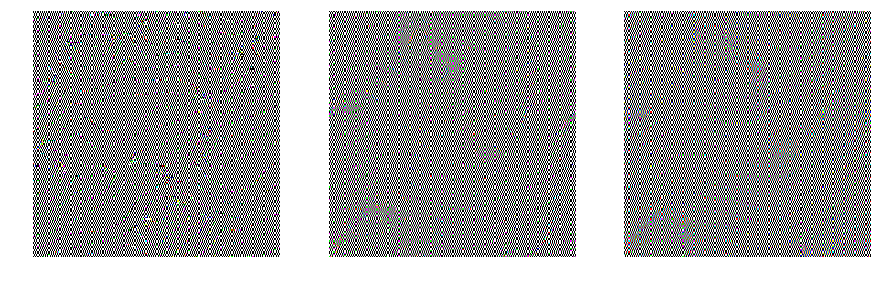

In [51]:
mob_pat = patterns[0][14]
p1, p2 = new_dft_patterns(mob_pat)
draw_imgs(list(map(maps_img, [mob_pat, p1, p2])))


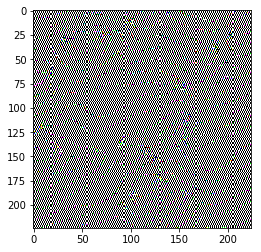

In [52]:
plt.imshow(maps_img(mob_pat))
plt.axis

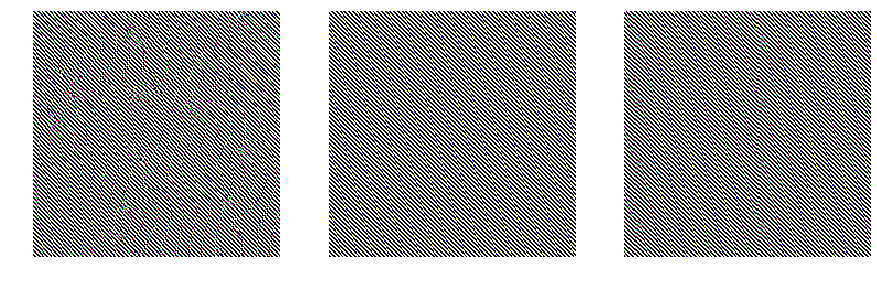

In [41]:
vgg_pat = patterns[1][14]
p1, p2 = new_dft_patterns(vgg_pat)
draw_imgs(list(map(maps_img, [vgg_pat, p1, p2])))


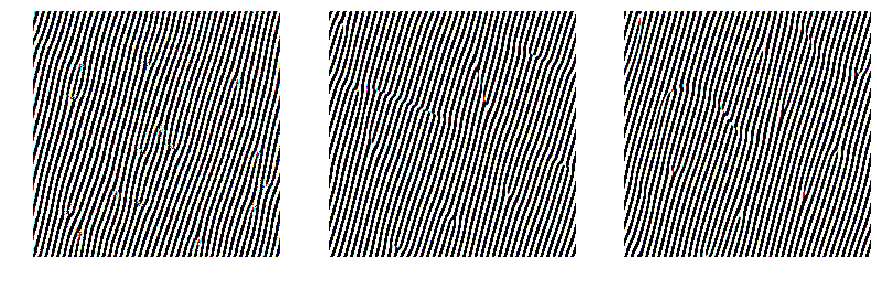

In [42]:
inc_pat = patterns[2][14]
p1, p2 = new_dft_patterns(inc_pat)
draw_imgs(list(map(maps_img, [inc_pat, p1, p2])))


# Draw pattern examples

In [32]:
import importlib

In [33]:
drawing = importlib.reload(drawing)

In [34]:
from drawing import draw_imgs

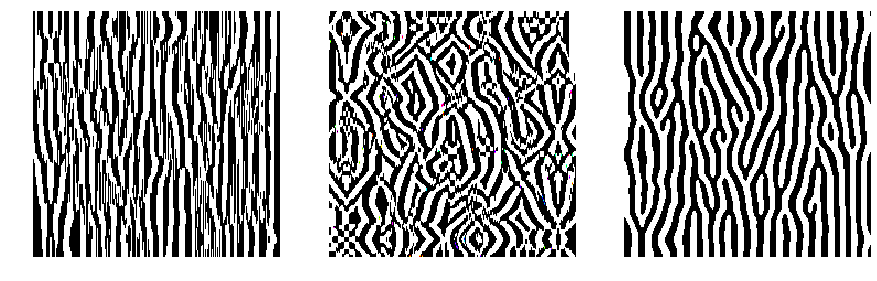

In [35]:
pattern_files = [f'{npy_prefix}/turing_true_mobilenet_500_56.npy',
                 f'{npy_prefix}/turing_true_vgg_500_49.npy',
                 f'{npy_prefix}/turing_true_inception_500_47.npy',
                ]

patterns_true = [np.load(pattern_file) for pattern_file in pattern_files]

draw_imgs(list(map(maps_img, patterns_true)))

In [53]:
def draw_save_patterns(patterns, model_names, experiment_prefix, width=3):
    draw_imgs(list(map(maps_img, patterns)), show=False, width=width)
    plt.savefig(f'turing_{experiment_prefix}_all.png', bbox_inches='tight')
    
    for pattern, model_name in zip(patterns, model_names):
        draw_imgs([maps_img(pattern)], show=False)
        plt.savefig(f'turing_{experiment_prefix}_{model_name}.png', bbox_inches='tight')

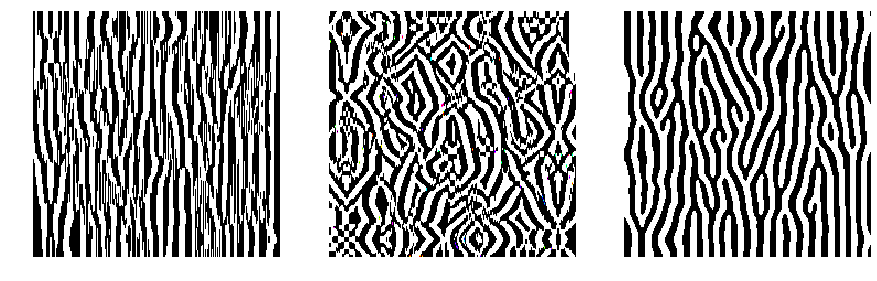

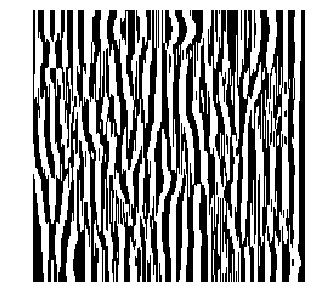

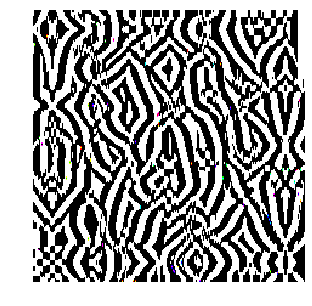

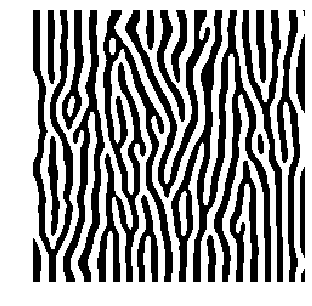

In [44]:
draw_save_patterns(patterns_true, model_names, 'true')

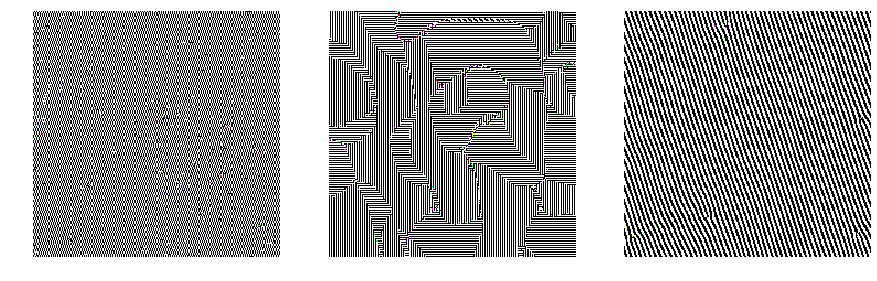

In [6]:
pattern_filter_files = [f'{npy_prefix}/turing_filter_pattern_mobilenet_91_500.npy',
                        f'{npy_prefix}/turing_filter_pattern_vgg_75_500.npy',
                        f'{npy_prefix}/turing_filter_pattern_inception_55_500.npy',
                       ]

patterns_filter = [np.load(pattern_file) for pattern_file in pattern_filter_files]

draw_imgs(list(map(maps_img, patterns_filter)))

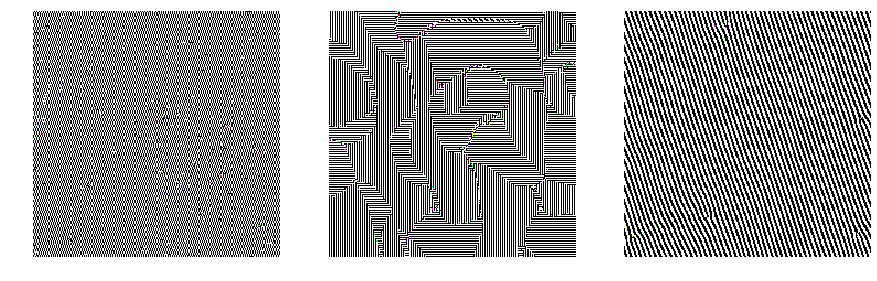

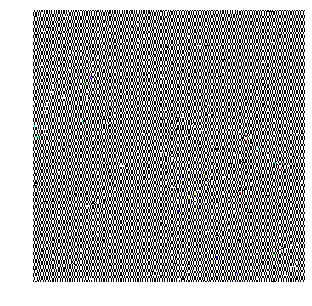

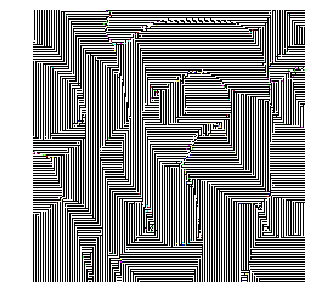

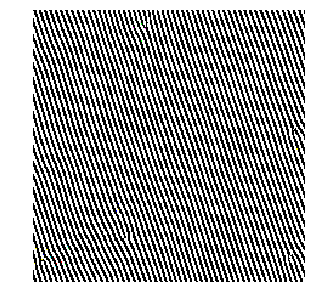

In [47]:
draw_save_patterns(patterns_filter, model_names, 'filter')

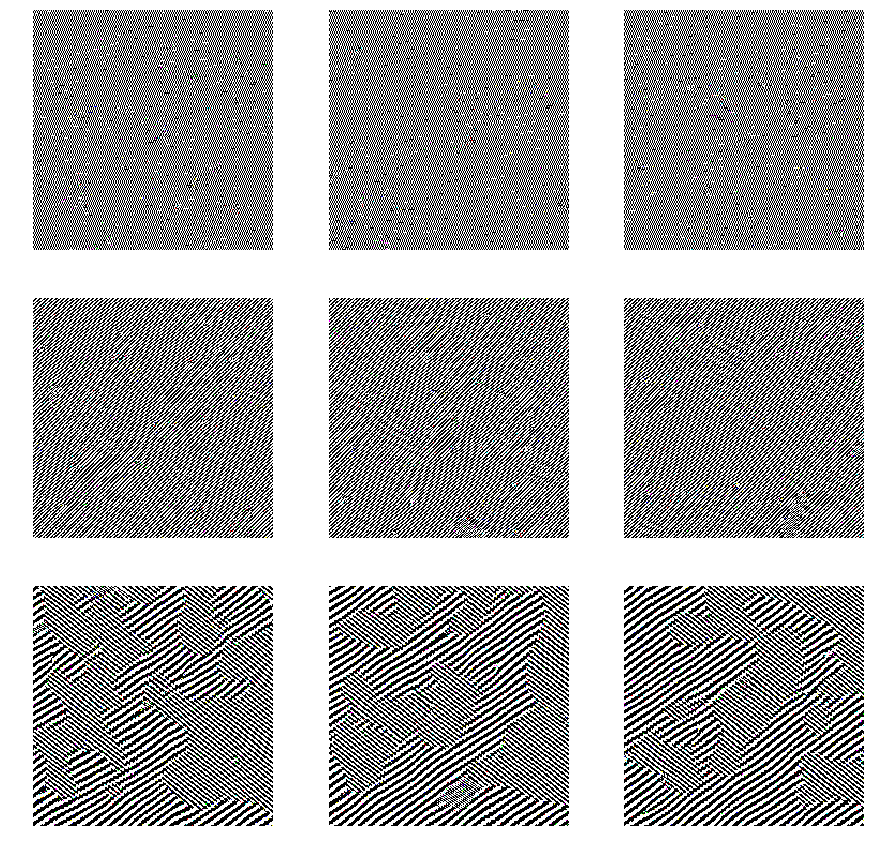

In [21]:
kernel_files = [f'{npy_prefix}/turing_filter_noinit_kernel_mobilenet_94_500.npy', 
                f'{npy_prefix}/turing_filter_noinit_kernel_vgg_77_500.npy', 
                f'{npy_prefix}/turing_filter_noinit_kernel_inception_53_500.npy',]

patterns_noinit = generate_patterns_noinit(kernel_files, img_size)

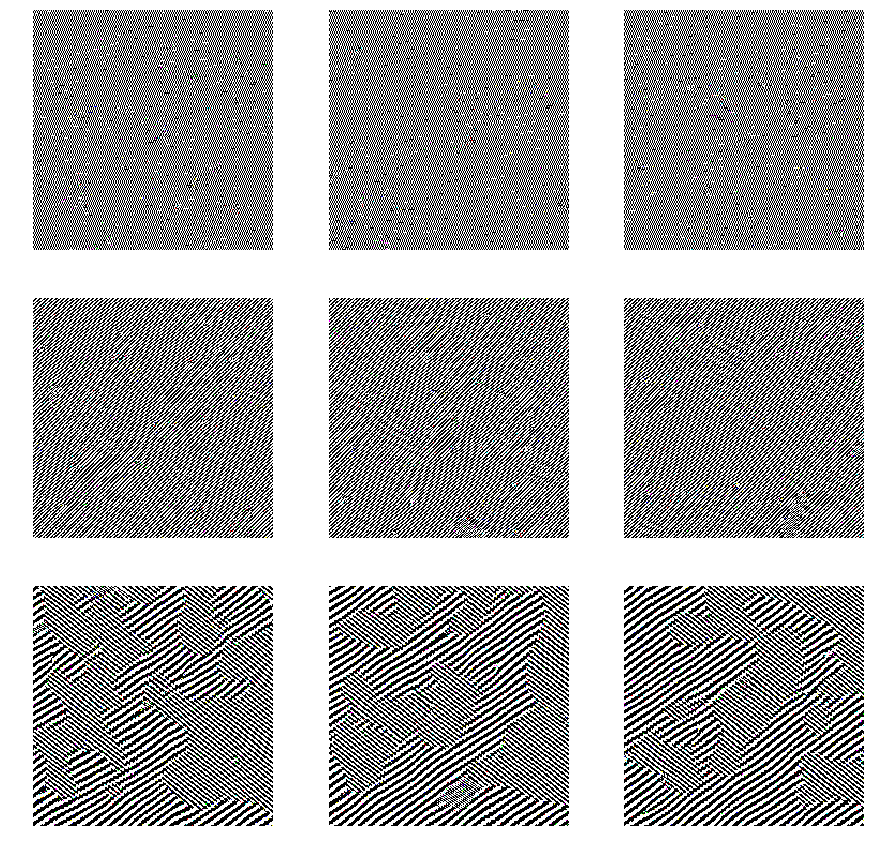

In [72]:
draw_imgs(list(map(maps_img, patterns_noinit)), width=3, show=False)

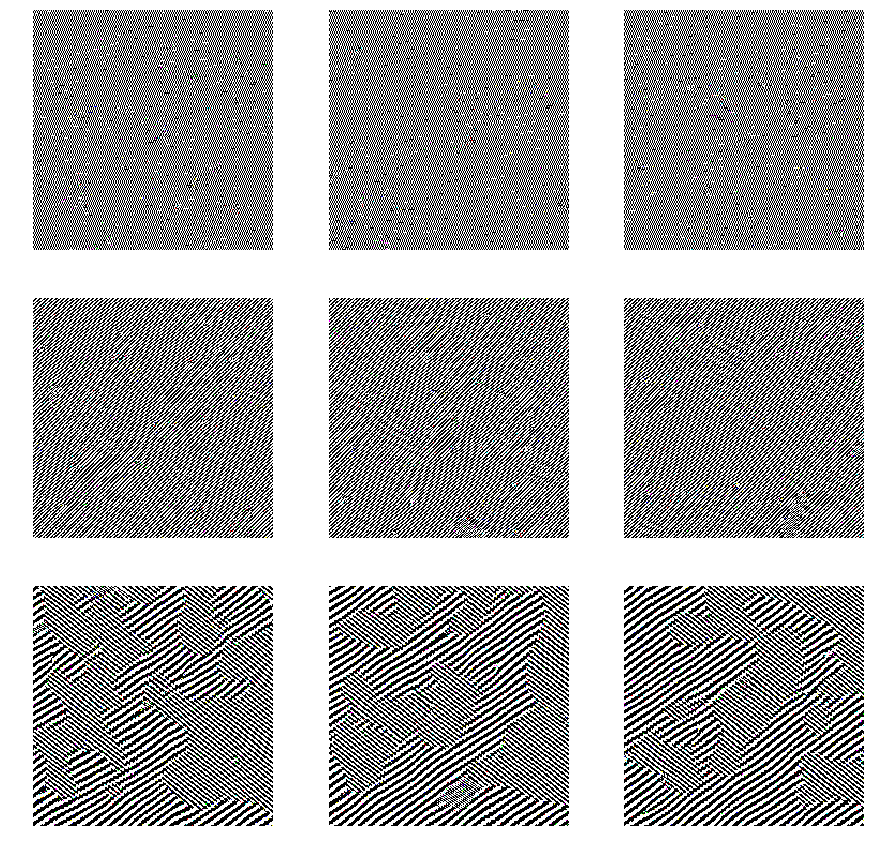

In [55]:
draw_imgs(list(map(maps_img, patterns_noinit)), width=3, show=False)
plt.savefig(f'turing_noinit_all.png', bbox_inches='tight')

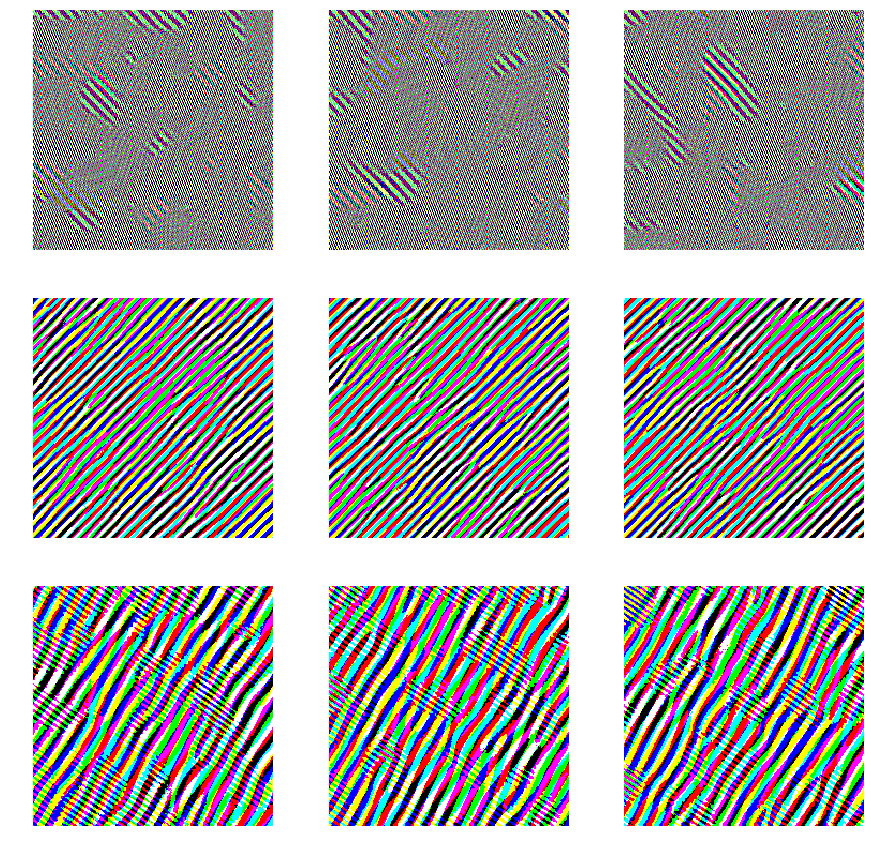

In [22]:
kernel_files = [f'{npy_prefix}/turing_filter_noinit_2d_mobilenet_61_500.npy', 
                f'{npy_prefix}/turing_filter_noinit_2d_vgg_60_500.npy', 
                f'{npy_prefix}/turing_filter_noinit_2d_inception_47_500.npy',]

patterns_2d = generate_patterns_noinit(kernel_files, img_size,
                                       separate_channels=True, kernel_type='2D')

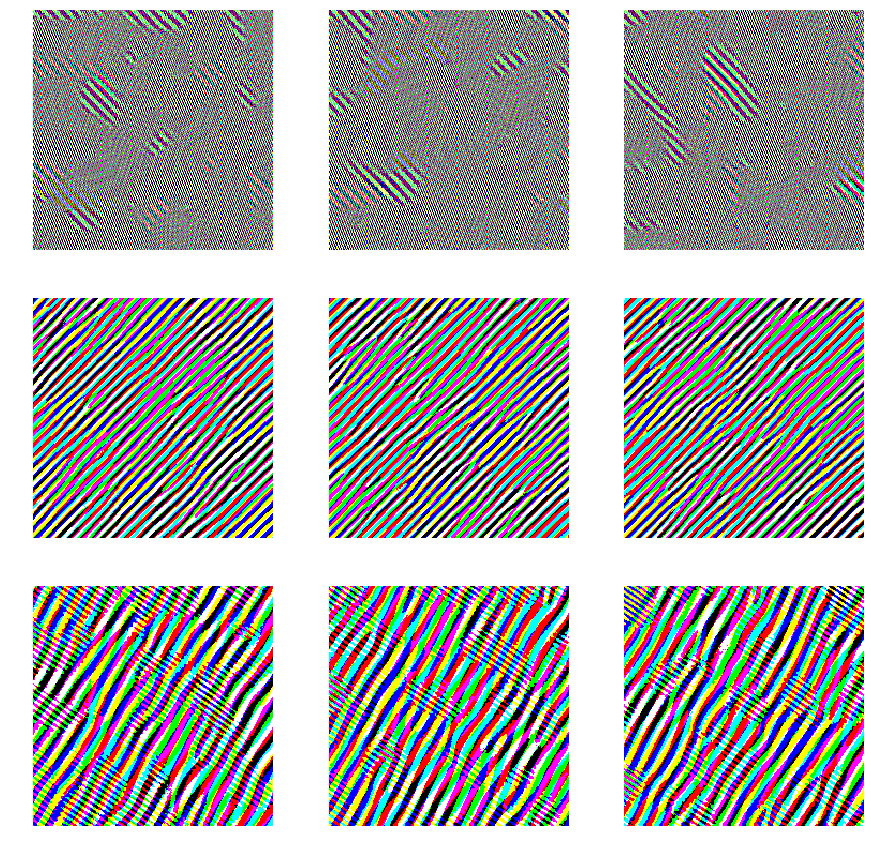

In [54]:
draw_imgs(list(map(maps_img, patterns_2d)), width=3, show=False)
plt.savefig(f'turing_2d_all.png', bbox_inches='tight')

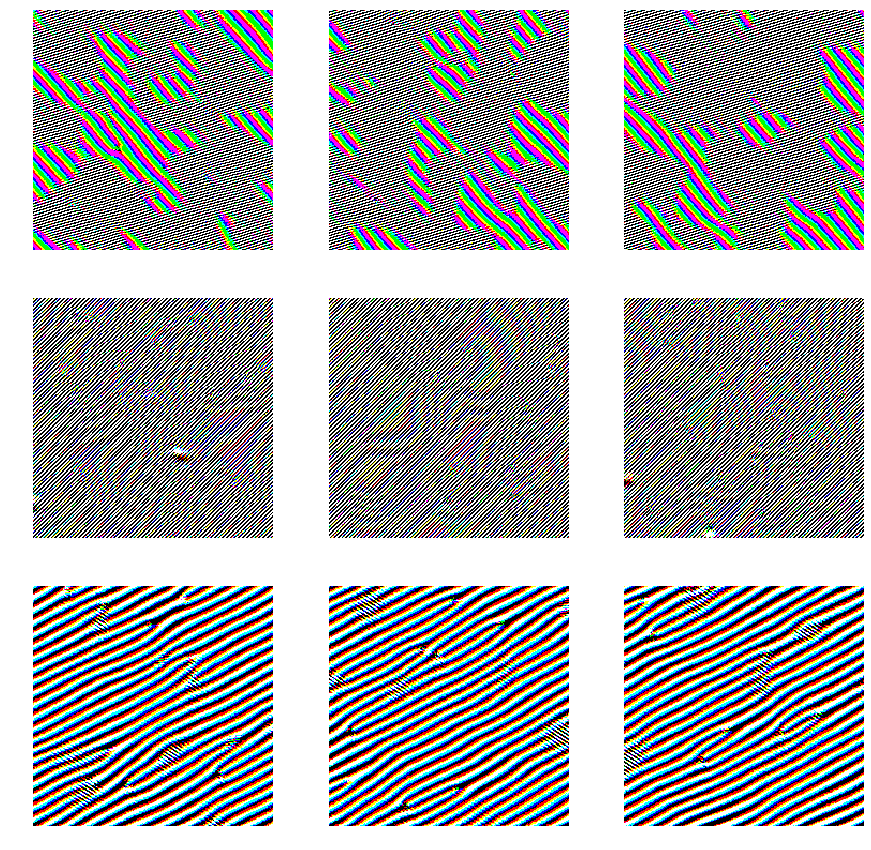

In [23]:
kernel_files = [f'{npy_prefix}/turing_filter_noinit_3d_mobilenet_81_500.npy', 
                f'{npy_prefix}/turing_filter_noinit_3d_vgg_78_500.npy', 
                f'{npy_prefix}/turing_filter_noinit_3d_inception_51_500.npy',]

patterns_3d = generate_patterns_noinit(kernel_files, img_size,
                                       separate_channels=True, kernel_type='3D')

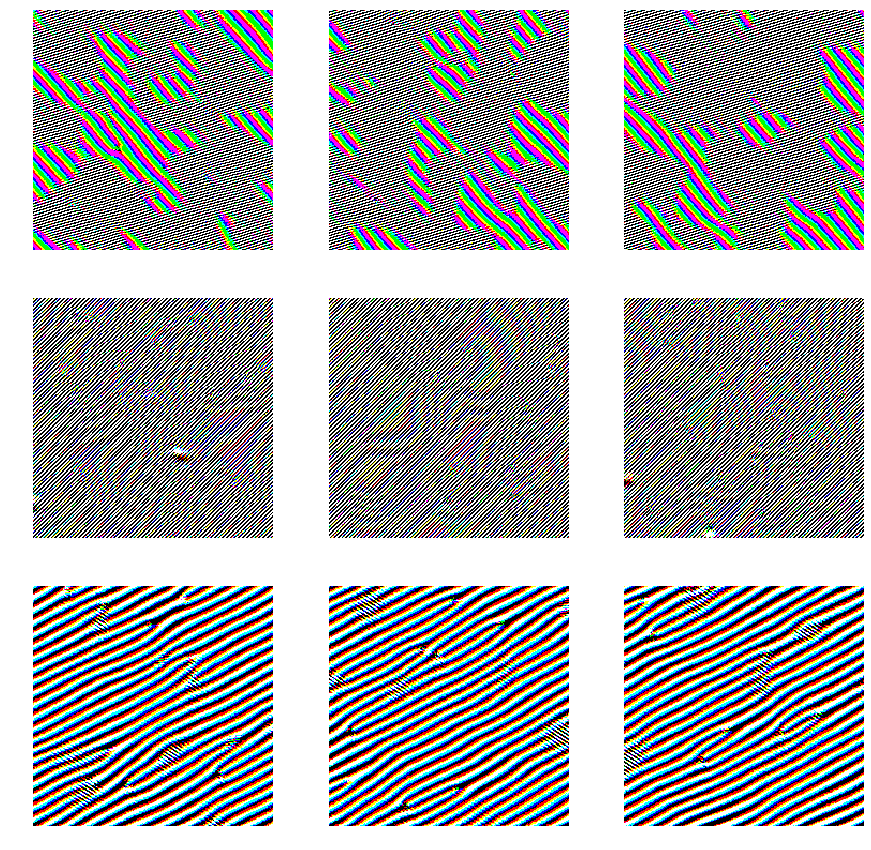

In [56]:
draw_imgs(list(map(maps_img, patterns_3d)), width=3, show=False)
plt.savefig(f'turing_3d_all.png', bbox_inches='tight')

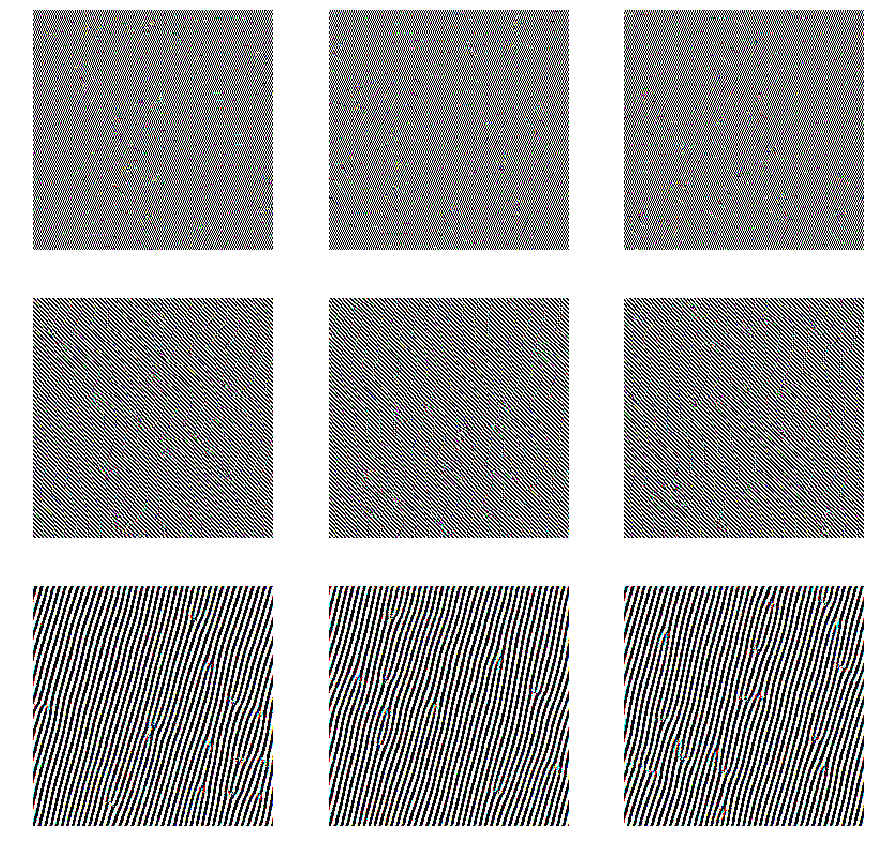

In [24]:
kernel_files = [(f'{npy_prefix}/turing_filter_noinit_pw_mobilenet_94_500.npy', 
                 f'{npy_prefix}/turing_filter_noinit_pw_mobilenet_94_p_500.npy'), 
                (f'{npy_prefix}/turing_filter_noinit_pw_vgg_77_500.npy', 
                 f'{npy_prefix}/turing_filter_noinit_pw_vgg_77_p_500.npy'), 
                (f'{npy_prefix}/turing_filter_noinit_pw_inception_53_500.npy', 
                 f'{npy_prefix}/turing_filter_noinit_pw_inception_53_p_500.npy'),
                ]

patterns_pw = generate_patterns_noinit(kernel_files, img_size,
                                       separate_channels=True, kernel_type='pointwise')

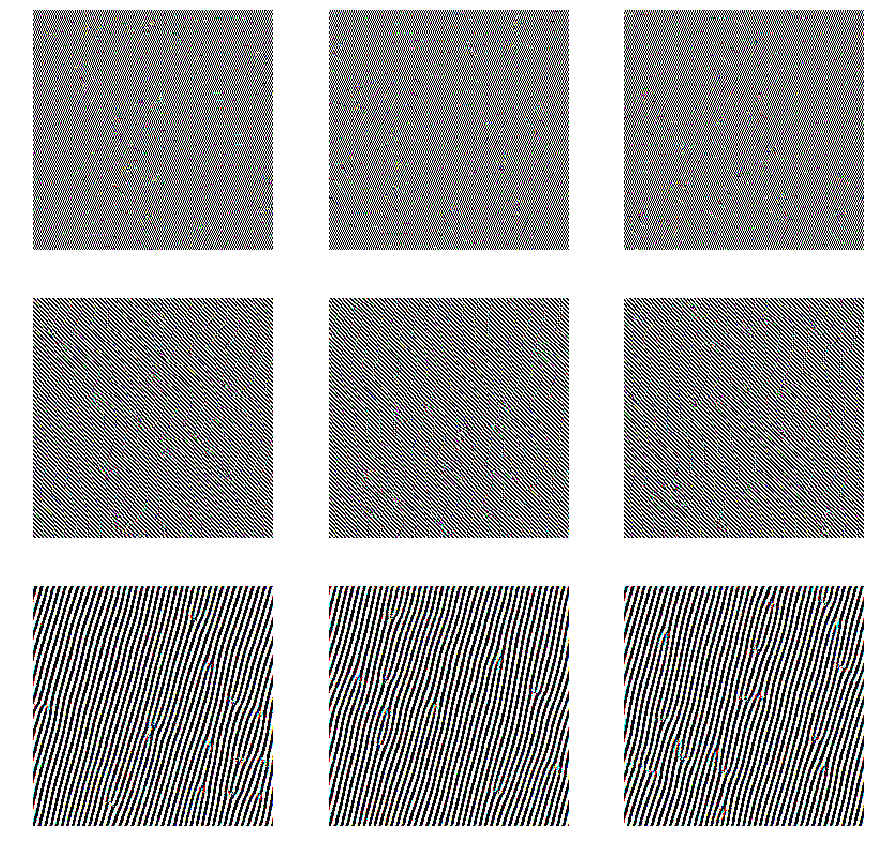

In [57]:
draw_imgs(list(map(maps_img, patterns_pw)), width=3, show=False)
plt.savefig(f'turing_pw_all.png', bbox_inches='tight')